In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import preprocessing
import pickle

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, RandomSampler, random_split
from torchvision.utils import make_grid
import torchvision.transforms as transforms
from torch.functional import F
import matplotlib.pyplot as plt
import os
from PIL import Image

In [2]:
root_dir = '/home/hunteryt/notebooks/Capstone_Project/south_dist_chunked_10000to47495_dx5_fs100_bpf14to35Hz'

### Import Latent Space Embeddings

In [109]:
# load in embedding dataframe
df = pd.read_csv('../data/encoded_data_2023_03_09T120806.csv', index_col=0)

In [9]:
# normalize the data
raw_data = df.iloc[:, 3:19]
scaler = preprocessing.StandardScaler().fit(raw_data)

data_scaled = scaler.transform(raw_data)

### Importing in Originial Images

In [11]:
# Writing a dataloader to load image data from ../data/ folder
class DASImageDataset(Dataset):
    def __init__(self, root_dir, transform=transforms.ToTensor()):
        self.root_dir = root_dir
        self.files = os.listdir(self.root_dir)
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        img_file =(os.path.join(self.root_dir, self.files[index]))
        img = Image.open(img_file)
        
        if self.transform:
            img = self.transform(img)
        
        return img, self.files[index]

In [12]:
# Applying custom convolution kernel to the image
class HorizontalEdge(object):
    def __init__(self):
        
        self.kernel = torch.tensor([[-1, -4, -1],
                                        [0, 0, 0],
                                        [1, 4, 1]], dtype=torch.float32)
    
    def __call__(self, img):
        # Applying 3x3 convolution kernel to the image
        img = F.conv2d(img.unsqueeze(0), self.kernel.unsqueeze(0).unsqueeze(0), padding=1)
        # Using sigmoid to get values between 0 and 1
        img = torch.sigmoid(img)
        # Binarizing the image
        img = (img > 0.54)*1.0
    
        return img.squeeze(0)

    
class ScalePixels(object):
    def __call__(self, img):
        img = (img - img.min())/(img.max() - img.min())
        return img
    

In [13]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.GaussianBlur(3, sigma=1),
    transforms.ToTensor(),
    HorizontalEdge(),
])

images = DASImageDataset(root_dir=root_dir, transform=transform)

orig_transform = transforms.Compose([transforms.ToTensor()])
orig_images = DASImageDataset(root_dir=root_dir, transform=orig_transform)

### Load Autoencoder

In [26]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        
        ### Convolutional section

        # Define for 128x128 images
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 8, 8, stride=2, padding=3), # (128 - 8 + 2*3)/2 + 1 = 64
            nn.ReLU(True),
            nn.Conv2d(8, 16, 8, stride=2, padding=3), # (64 - 8 + 2*3)/2 + 1 = 32
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 8, stride=2, padding=3), # (32 - 8 + 2*3)/2 + 1 = 16
            nn.ReLU(True),
            nn.Conv2d(32, 64, 8, stride=2, padding=3), # (16 - 8 + 2*3)/2 + 1 = 8
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 128, 8, stride=2, padding=3), # (8 - 8 + 2*3)/2 + 1 = 4
            nn.BatchNorm2d(128),
            nn.ReLU(True)
        )

        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(4 * 4 * 128, fc2_input_dim),
            nn.ReLU(True),
            nn.Linear(fc2_input_dim, encoded_space_dim)
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x
    
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()

        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, fc2_input_dim),
            nn.ReLU(True),
            nn.Linear(fc2_input_dim, 4 * 4 * 128),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1,
        unflattened_size=(128, 4, 4))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 8, stride=2, padding=3), # (4 - 1)*2 - 2*1 + 4 = 8
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 8, stride=2, padding=3), # (8 - 1)*2 - 2*1 + 4 = 16
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 16, 8, stride=2, padding=3), # (16 - 1)*2 - 2*1 + 4 = 32
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 8, stride=2, padding=3), # (32 - 1)*2 - 2*1 + 4 = 64
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 8, stride=2, padding=3) # (64 - 1)*2 - 2*1 + 4 = 128
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [27]:
# Load encoder and decoder from pth file
encoded_space_dim = 16
fc2_input_dim = 256
device = 'cpu'
encoder = Encoder(encoded_space_dim,fc2_input_dim).to(device)
decoder = Decoder(encoded_space_dim,fc2_input_dim).to(device)
encoder.load_state_dict(torch.load(f'../model/encoder_cpu_all_data_2023_03_09T120806.pth'))
decoder.load_state_dict(torch.load(f'../model/decoder_cpu_all_data_2023_03_09T120806.pth'))

def view_decoder(img):
    result = decoder(img.unsqueeze(0).to(device))
    plt.figure(figsize=(8,4))
    #plt.subplot(1,2,1)
    #plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    plt.subplot(1,2,2)
    plt.imshow(result.cpu().squeeze().detach().numpy(), cmap='gist_gray')
    plt.show()

### Load in Clustering Algorithm

In [105]:
with open('../model/gmm_80_clusters.sav', 'rb') as f:
    gmm_80 = pickle.load(f)

Do not run the 'Generating Clusters' section below if you intend use the loaded in algorithm from above. 

### Generating Clusters

In [22]:
def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)

In [41]:
model_list = dict()
for i in range(70, 100, 5):
    tmp_gmm = GaussianMixture(n_components=i)
    
    tmp_gmm.fit(data_scaled)
    
    model_list[str(i)] = tmp_gmm

/anaconda/envs/ooi_dev/lib/python3.10/site-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/anaconda/envs/ooi_dev/lib/python3.10/site-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/anaconda/envs/ooi_dev/lib/python3.10/site-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
/anaconda/envs/ooi_dev/lib/python3.10/site-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


In [102]:
# save the best performing model (80 clusters)

# uncomment code below to re-save the model
#eighty_gmm_file_name = '../model/gmm_80_clusters.sav'
#pickle.dump(model_list['80'], open(eighty_gmm_file_name,'wb'))

### Visualizing Clusters & Determining Performance

In this section, I take random samples from each cluster and visually inspect each for noise in order to determine which clusters are more likely to contain whale vocalizaitons. From this analysis, I group clusters based on my confidence that all image samples within them contain a signal. I also visualize the centroid of each cluster by running it through a decoder. 

In [110]:
# get predictions for under 80 cluster
Y_80 = gmm_80.predict(data_scaled)
df['80_cluster_id'] = Y_80

In [111]:
def view_batch(batch):
    grid = make_grid(batch, nrow=8, padding=5)
    plt.figure(figsize=(20,10))
    plt.imshow(np.transpose(grid, (1,2,0)))
    plt.show()

def visualize_samples_from_cluster(df, clust_id, n=12, clust_id_name='cluster_id'):
    df_samples = df[df[clust_id_name] == clust_id]
    num_samples = df_samples.shape[0]
    batch_pre = []
    batch_post = []

    for i in range(n):
        idx = np.random.choice(num_samples)
        fl_name = df_samples.index.values[idx]
        
        fl_name = fl_name.replace(' ', 'T')
        fl_name = fl_name + '000000_start' + str(list(df_samples.distance_start)[idx])

        j, _ = [(j,f) for j,f in enumerate(images.files) if f.startswith(fl_name)][0]
        batch_pre.append(orig_images[j][0])
        batch_post.append(images[j][0])
    
    view_batch(batch_pre)
    view_batch(batch_post)

0


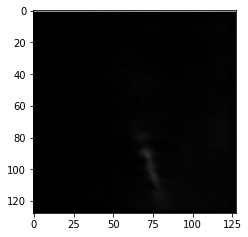

1


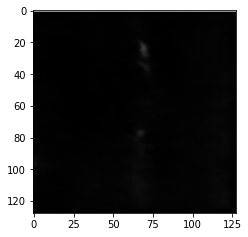

2


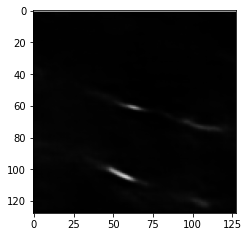

3


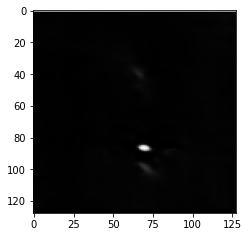

4


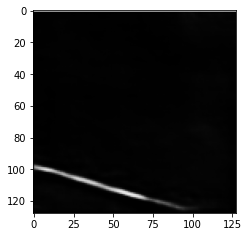

5


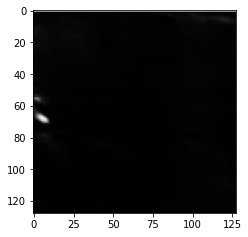

6


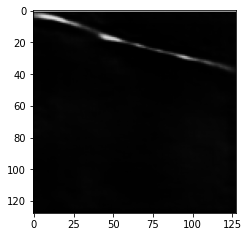

7


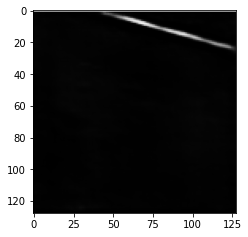

8


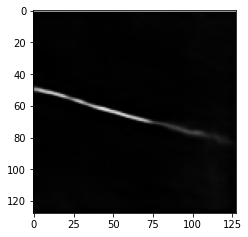

9


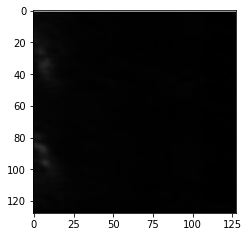

10


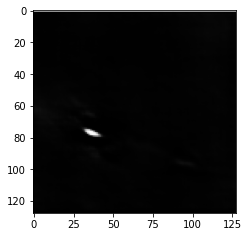

11


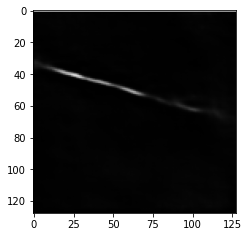

12


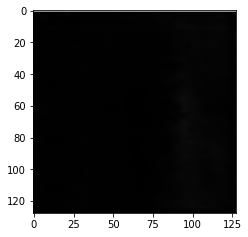

13


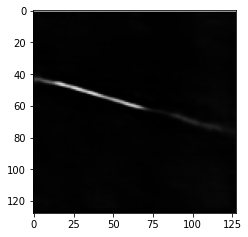

14


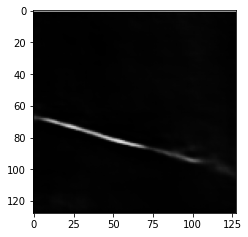

15


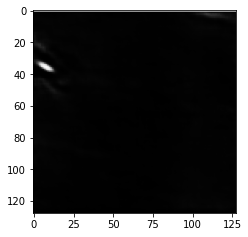

16


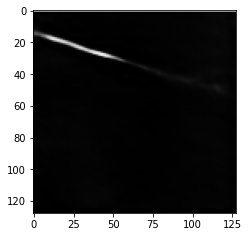

17


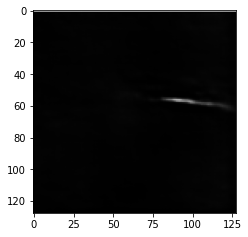

18


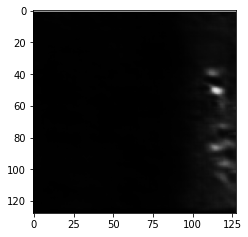

19


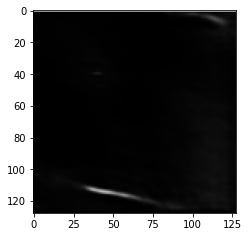

20


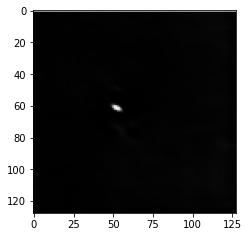

21


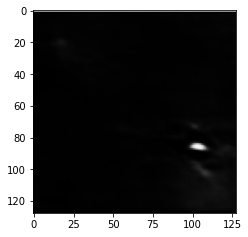

22


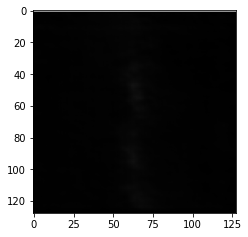

23


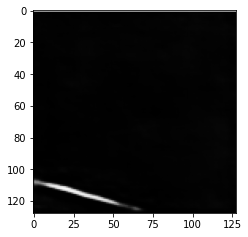

24


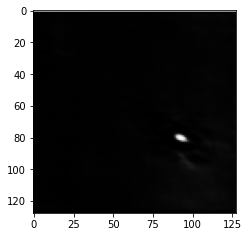

25


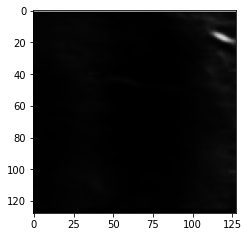

26


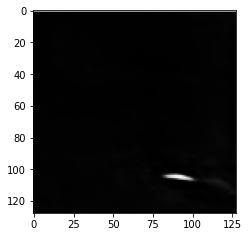

27


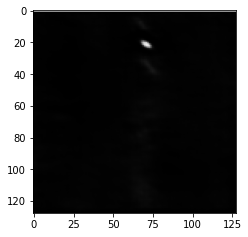

28


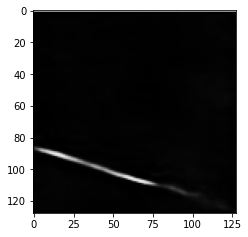

29


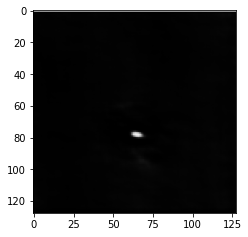

30


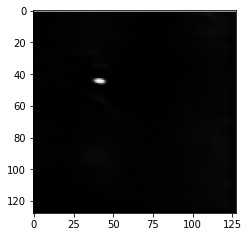

31


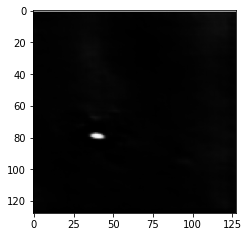

32


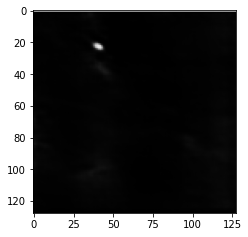

33


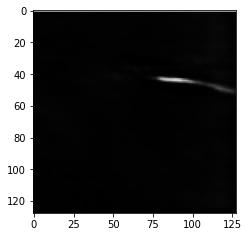

34


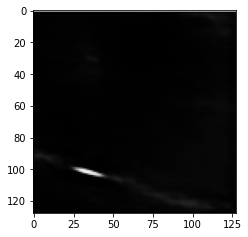

35


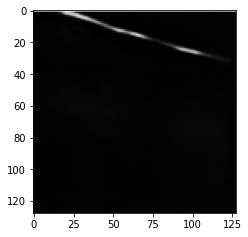

36


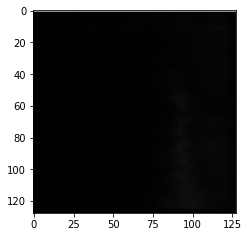

37


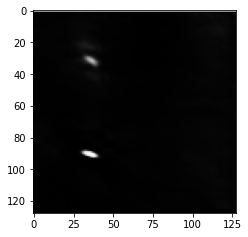

38


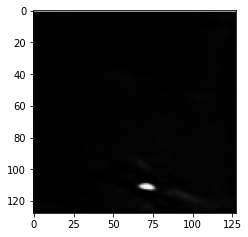

39


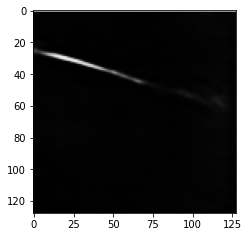

40


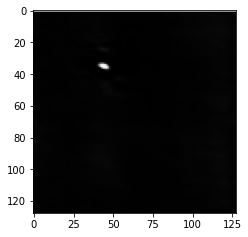

41


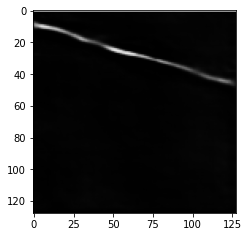

42


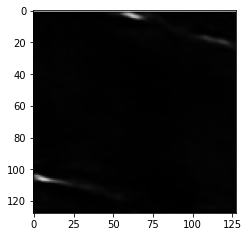

43


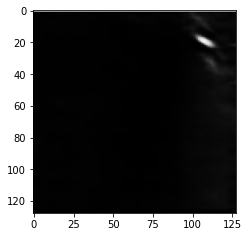

44


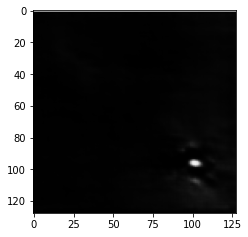

45


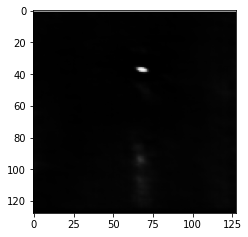

46


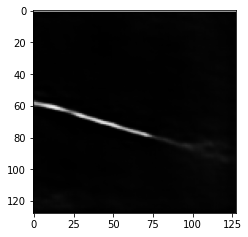

47


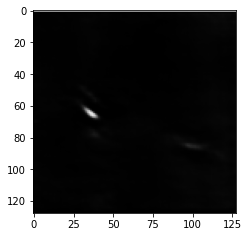

48


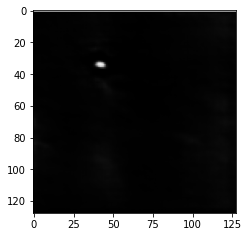

49


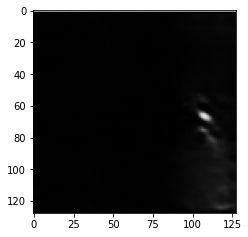

50


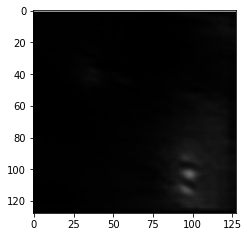

51


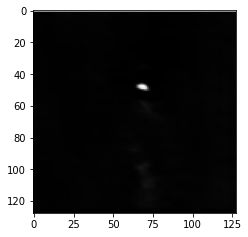

52


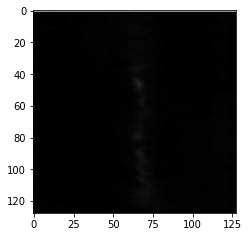

53


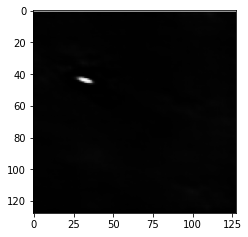

54


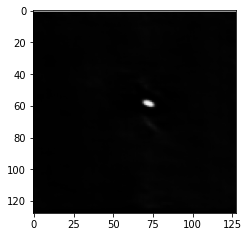

55


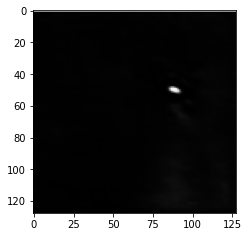

56


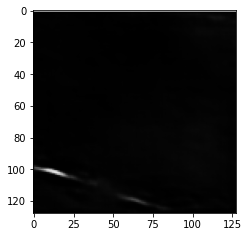

57


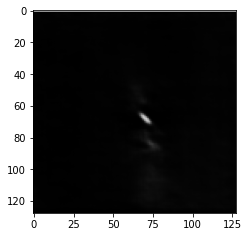

58


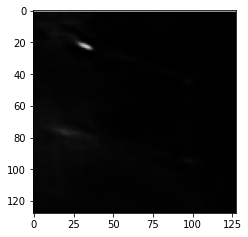

59


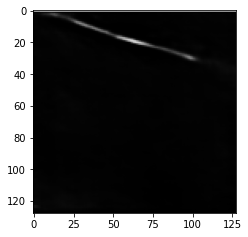

60


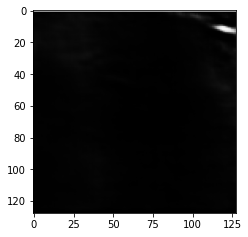

61


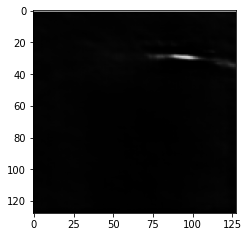

62


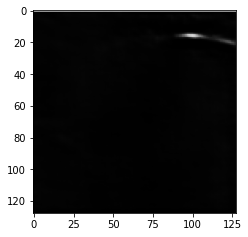

63


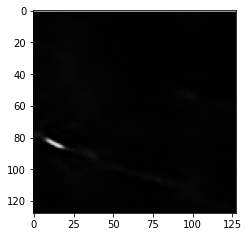

64


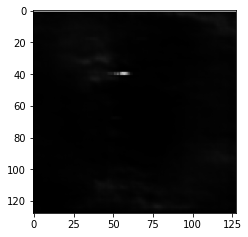

65


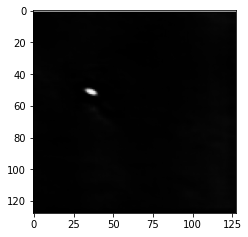

66


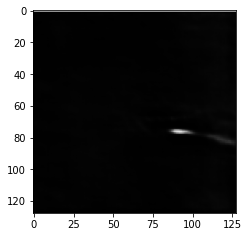

67


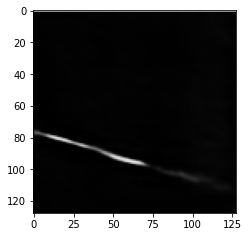

68


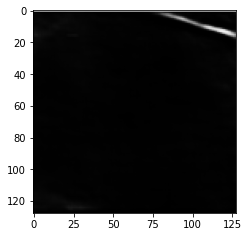

69


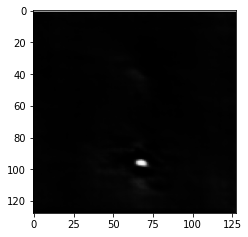

70


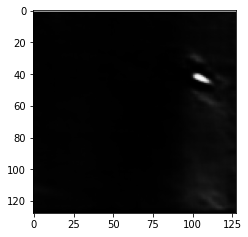

71


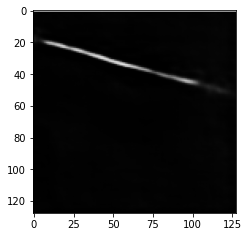

72


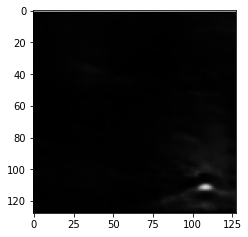

73


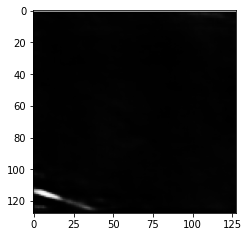

74


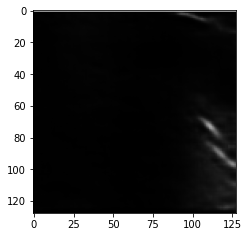

75


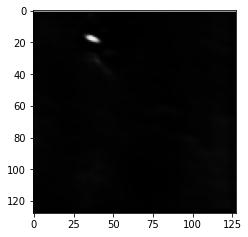

76


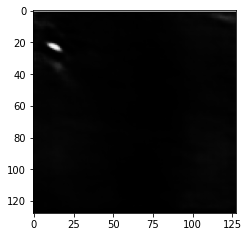

77


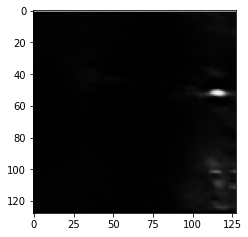

78


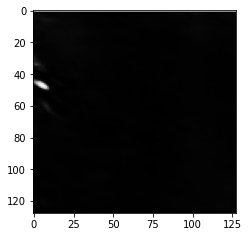

79


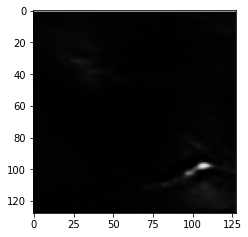

In [107]:
centroids_80 = gmm_80.means_
for i in range(80):
    print(i)
    view_decoder(torch.Tensor(centroids_80[i]))

0


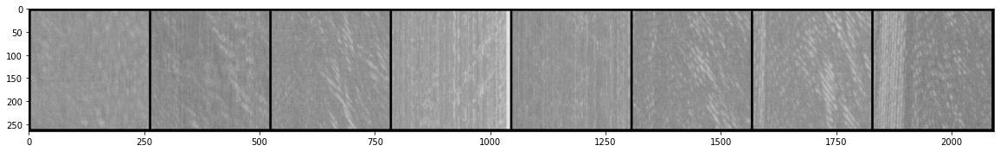

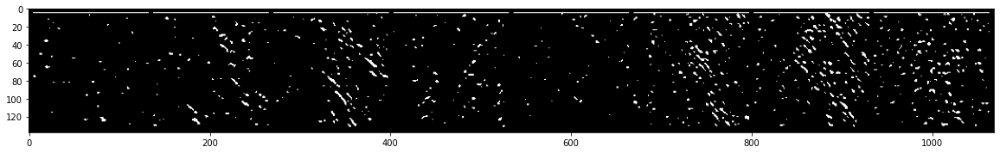

1


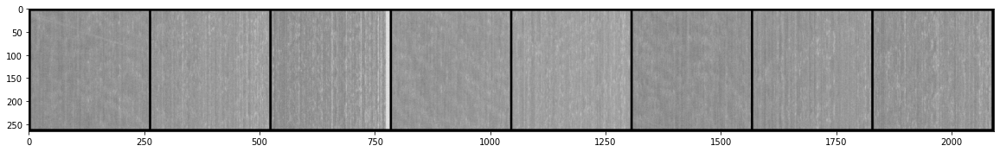

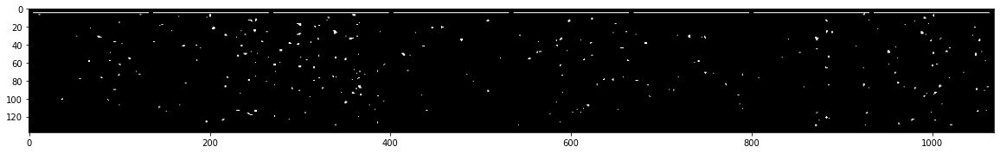

2


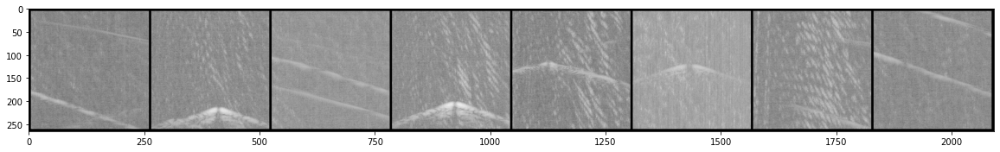

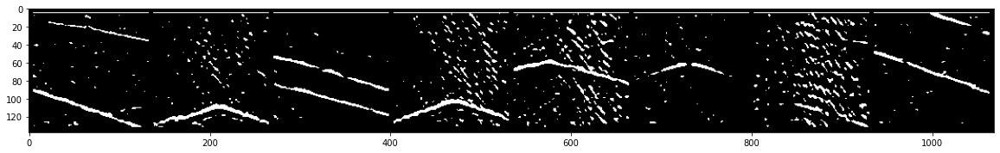

3


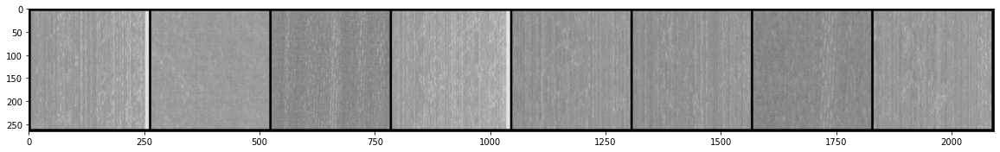

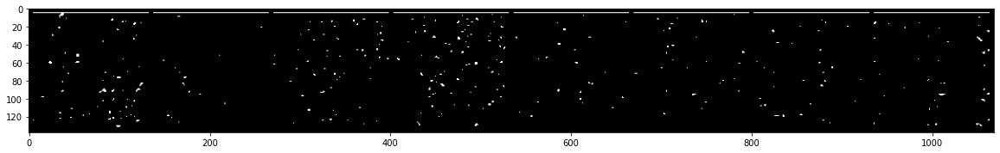

4


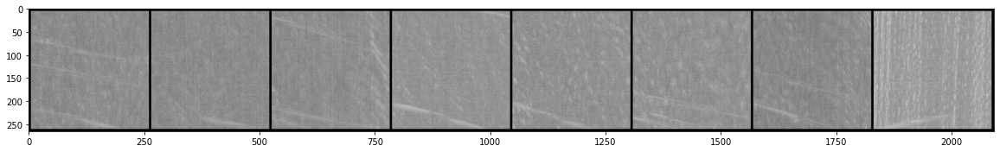

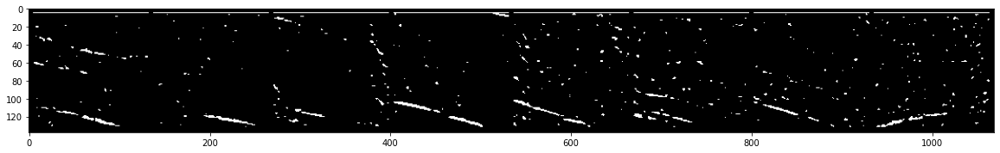

5


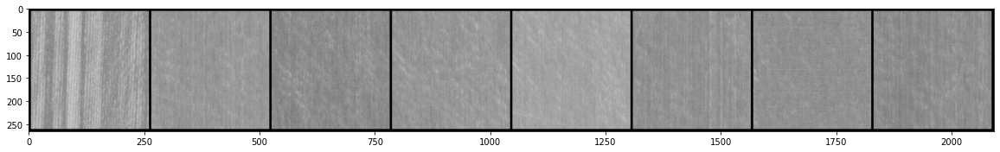

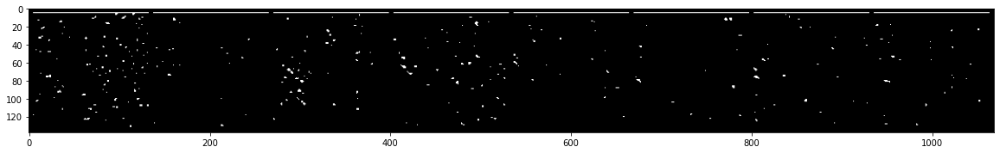

6


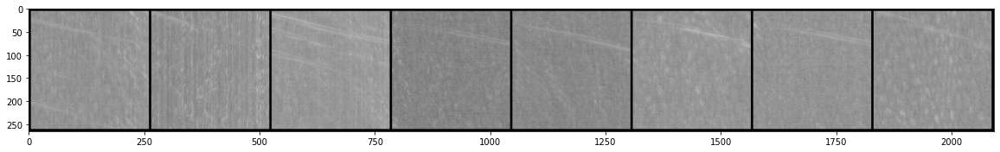

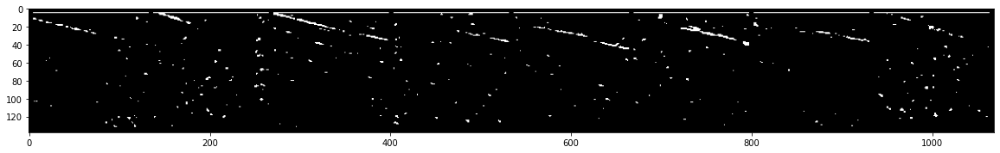

7


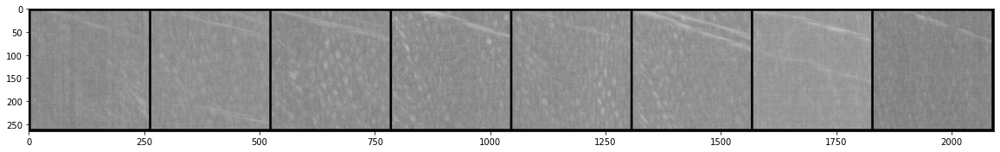

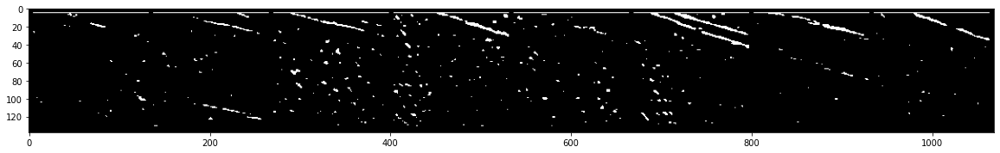

8


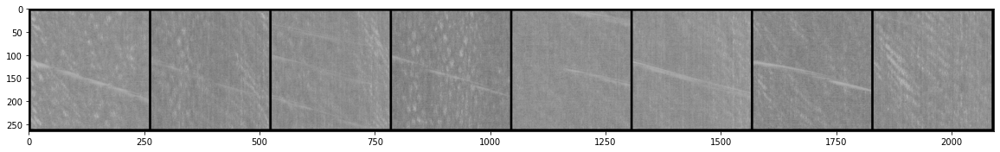

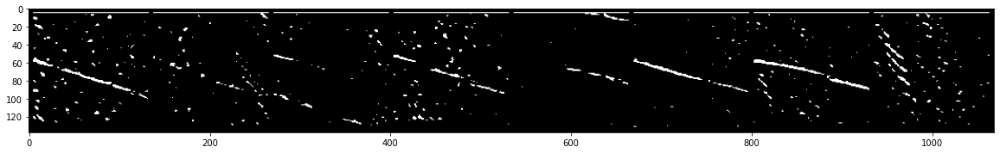

9


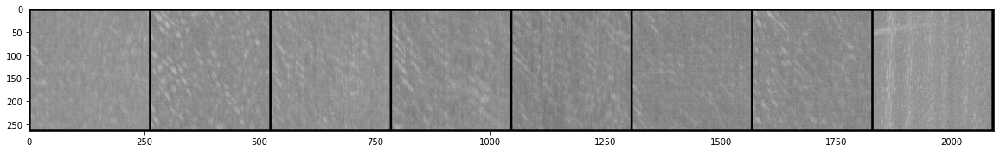

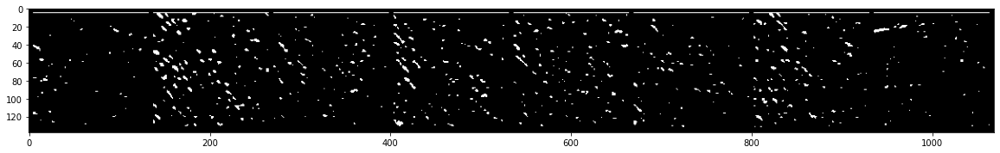

10


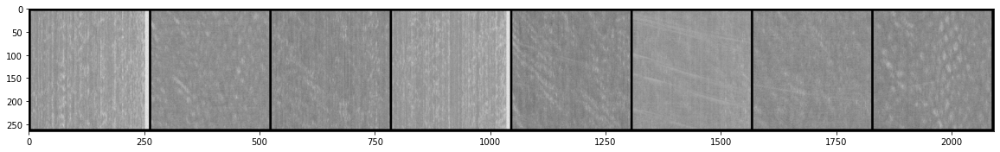

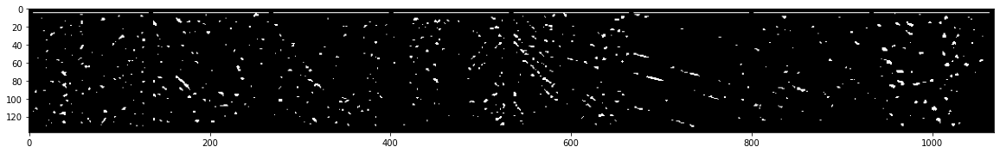

11


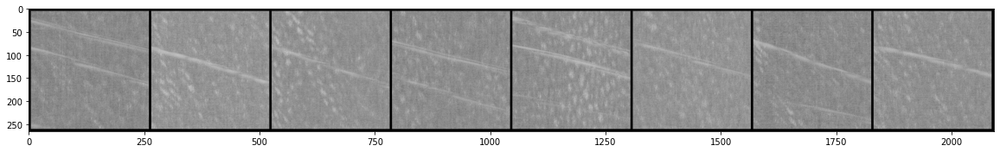

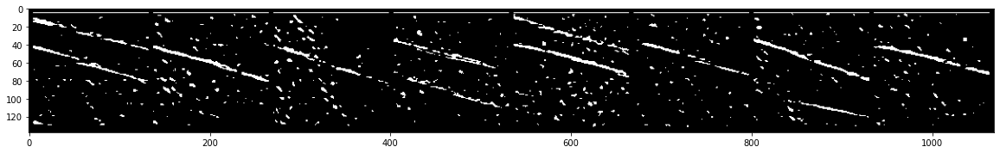

12


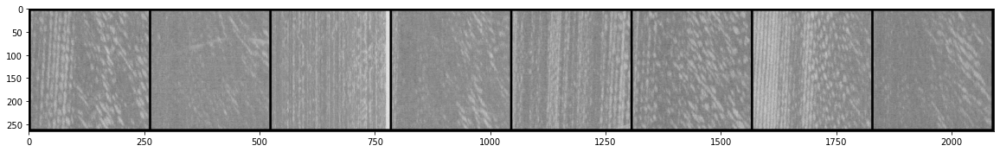

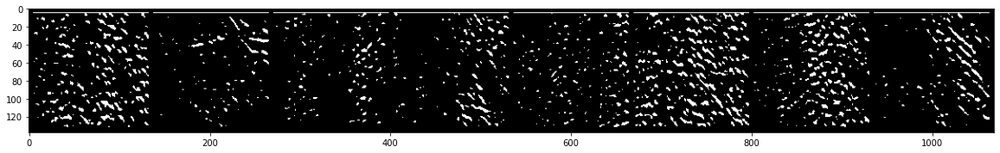

13


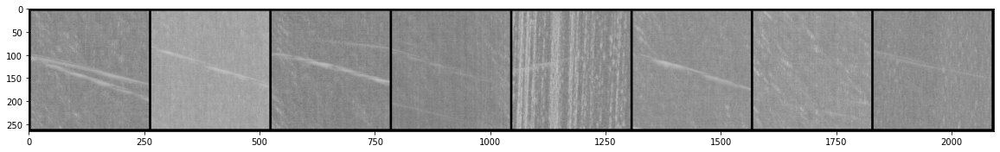

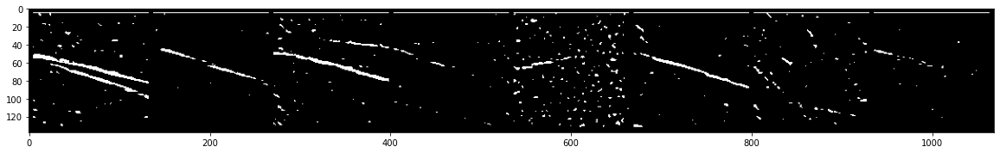

14


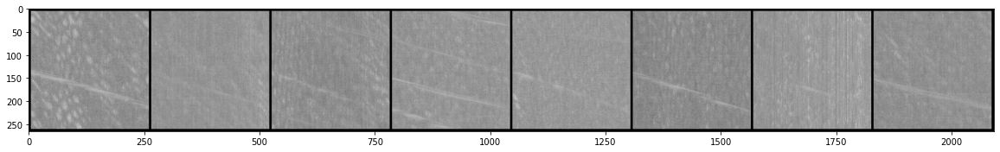

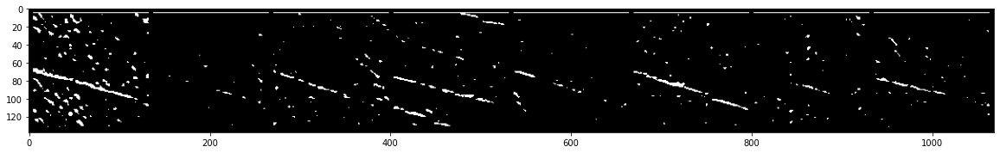

15


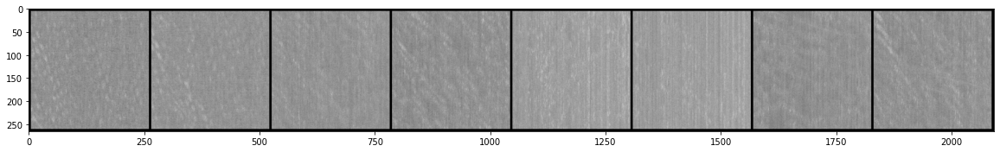

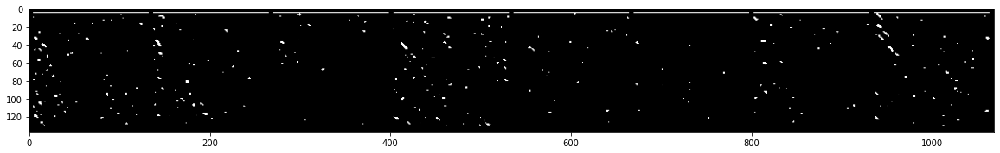

16


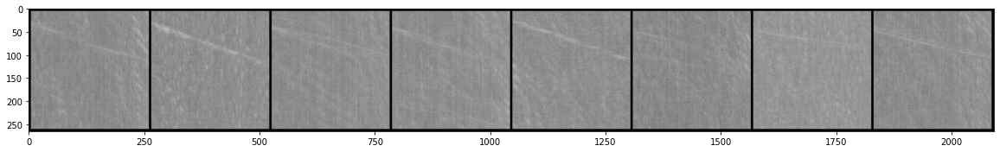

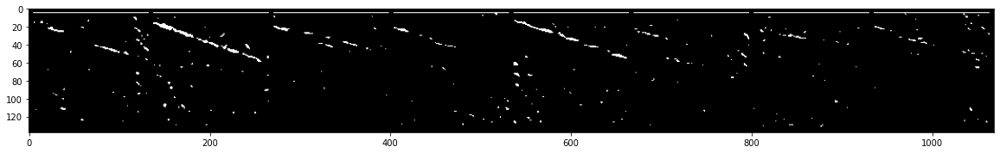

17


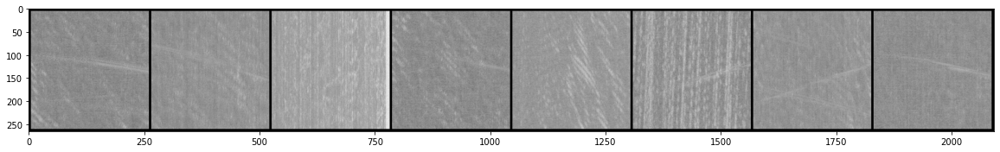

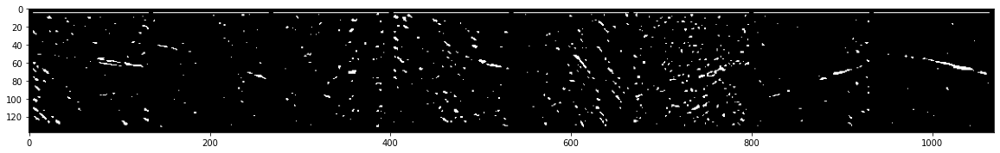

18


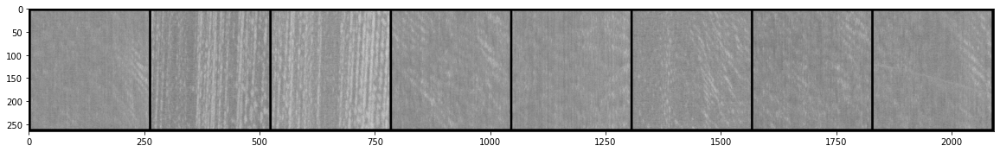

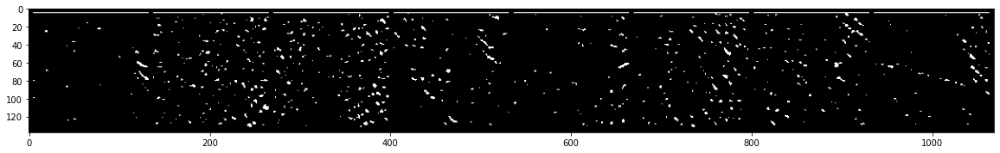

19


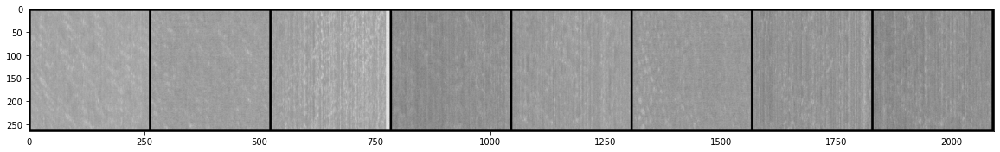

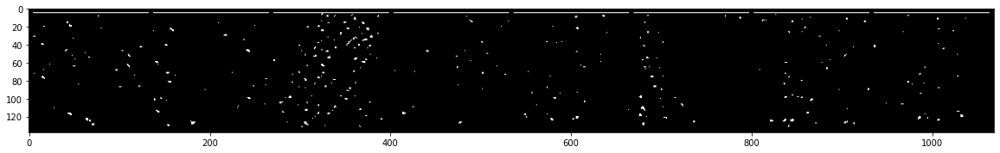

20


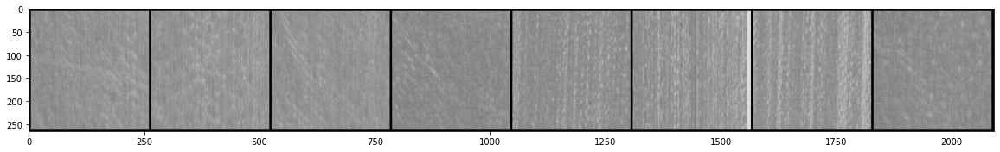

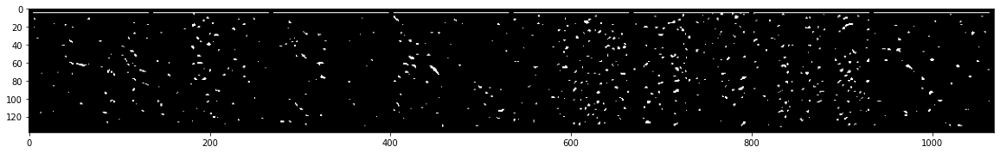

21


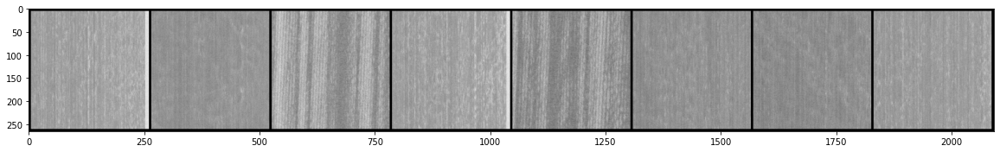

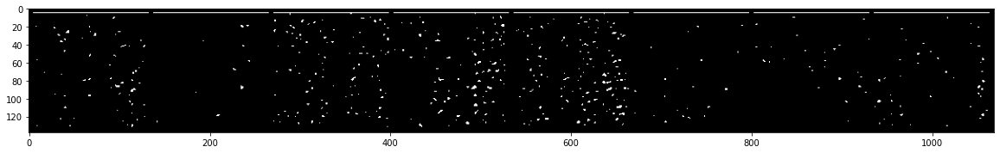

22


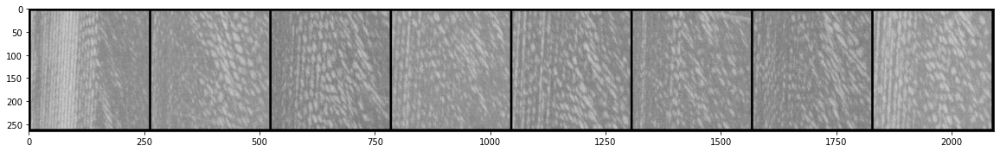

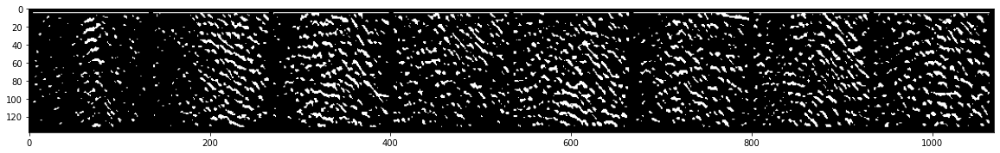

23


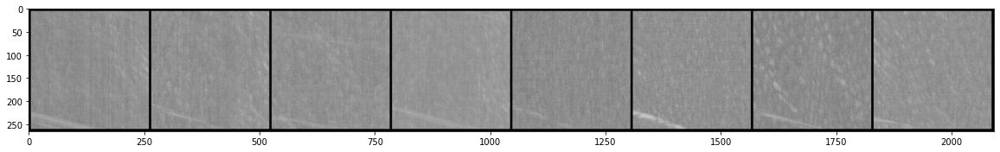

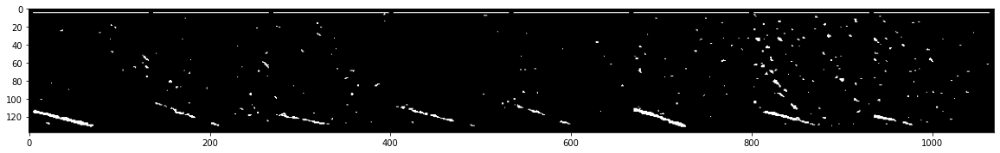

24


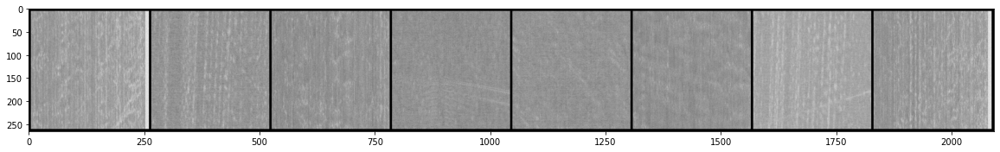

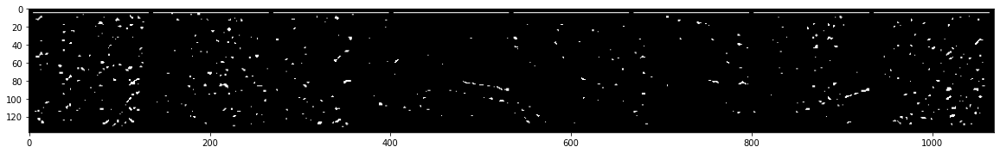

25


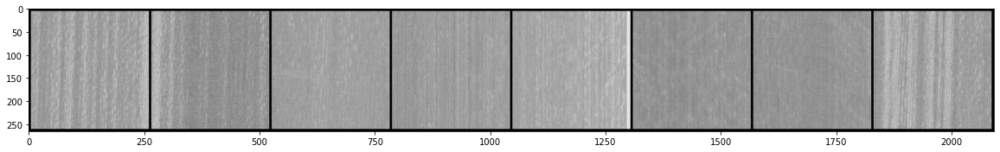

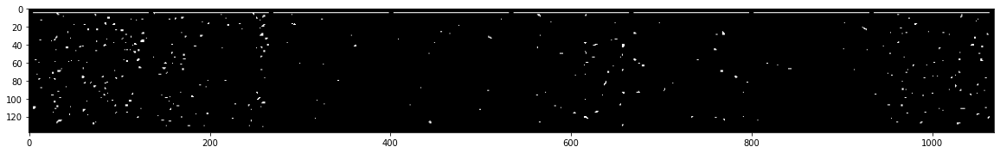

26


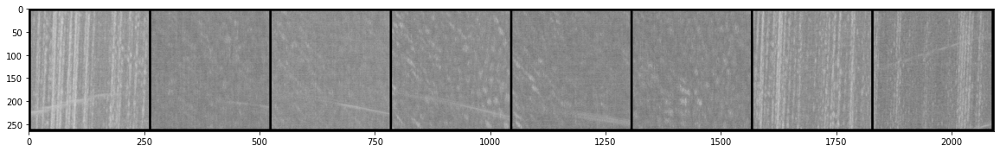

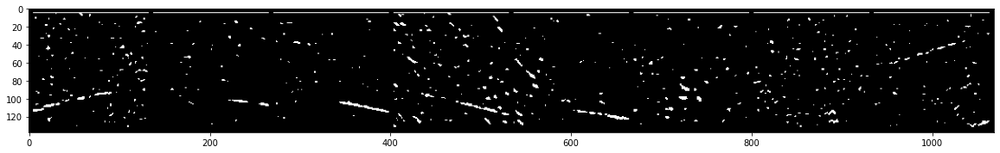

27


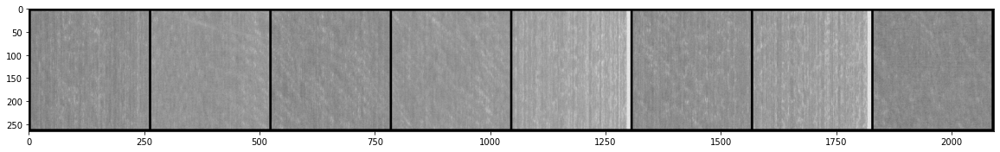

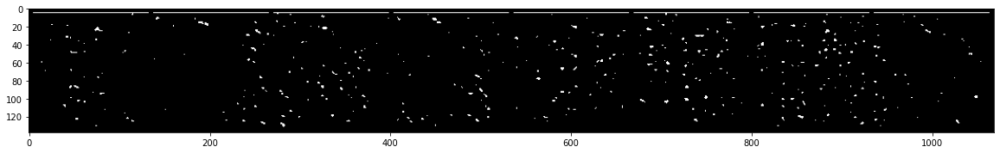

28


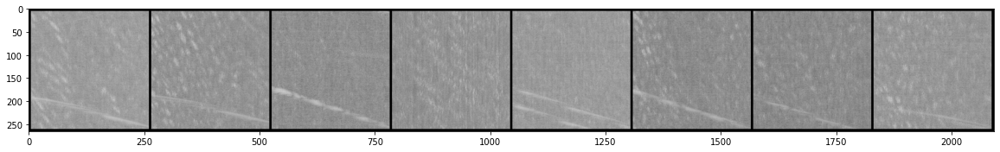

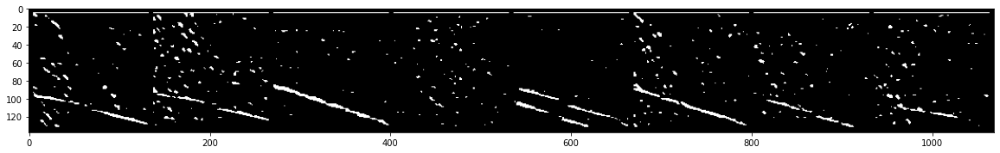

29


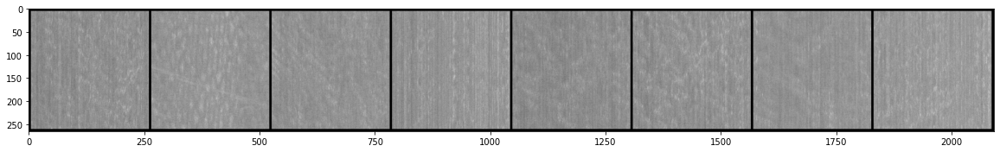

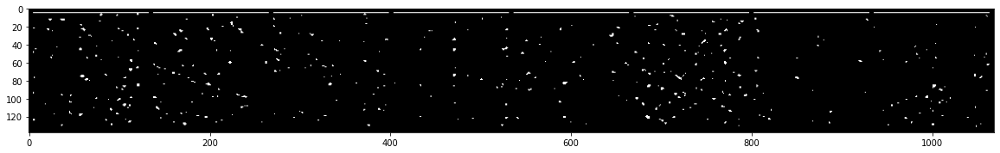

30


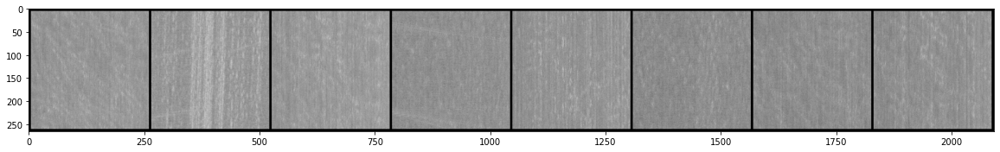

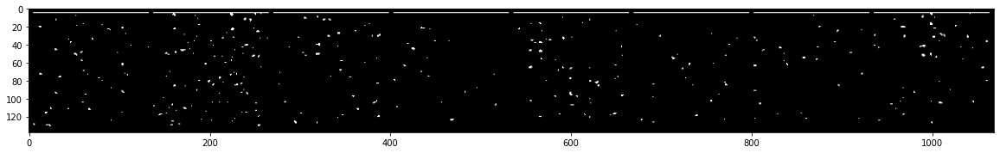

31


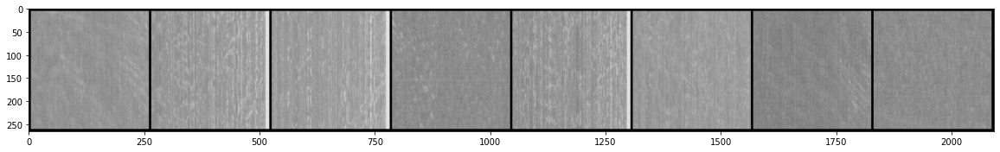

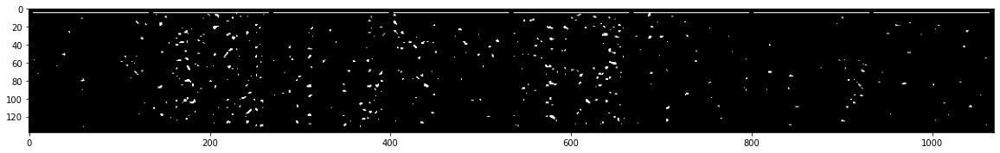

32


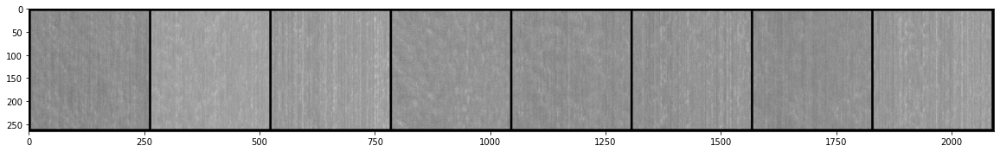

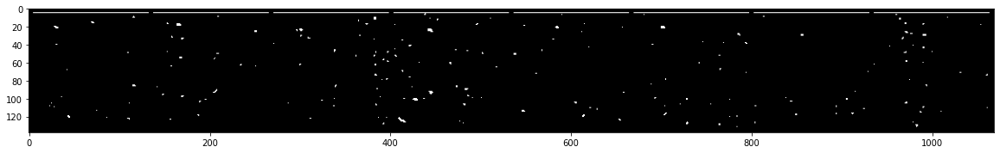

33


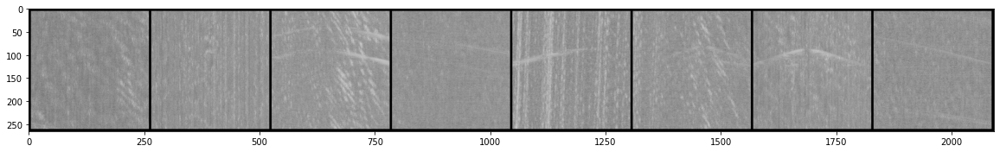

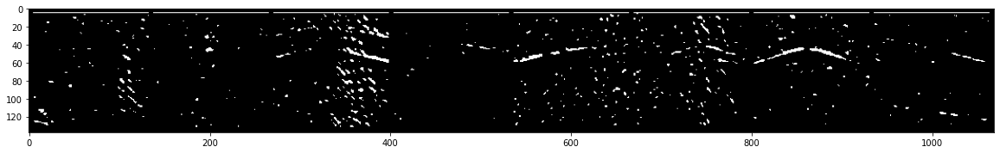

34


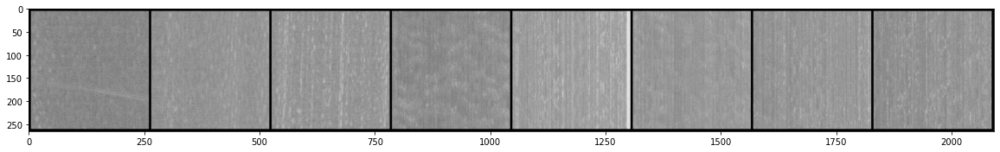

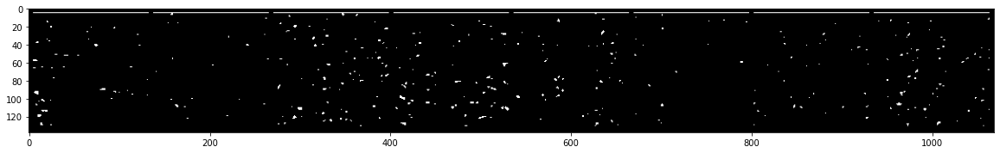

35


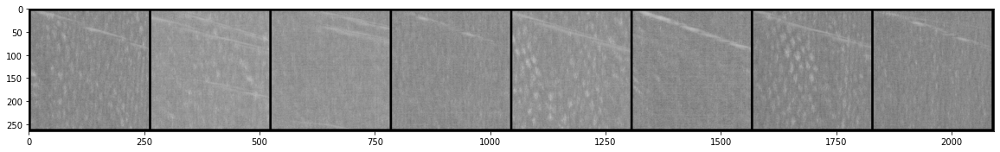

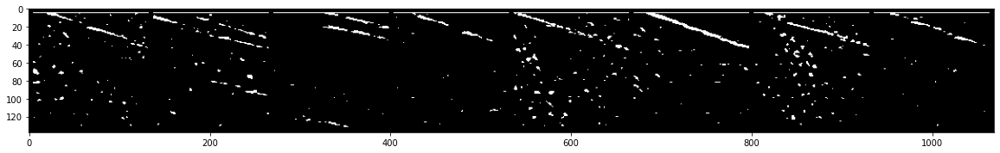

36


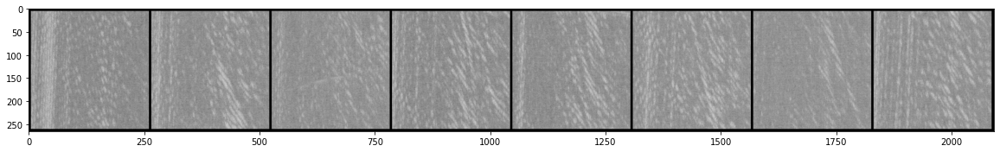

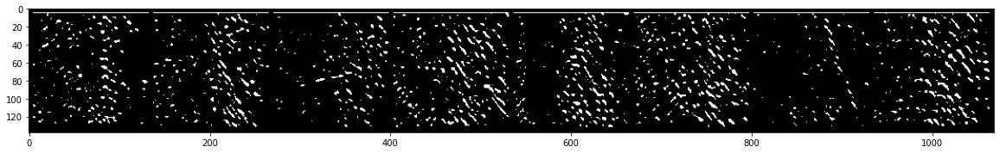

37


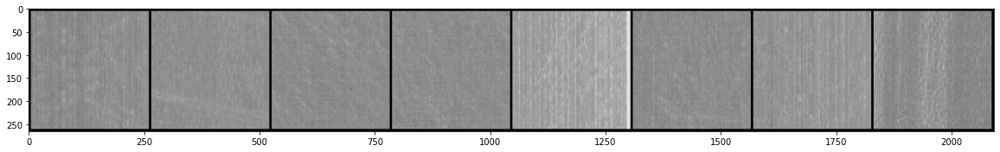

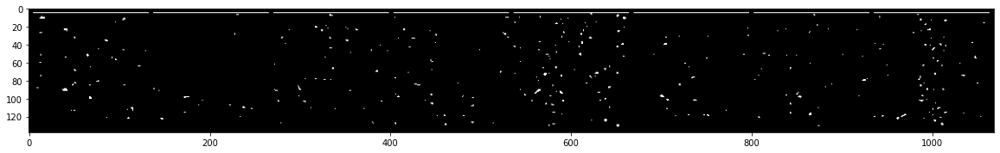

38


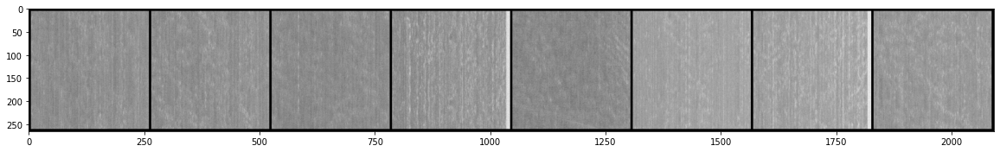

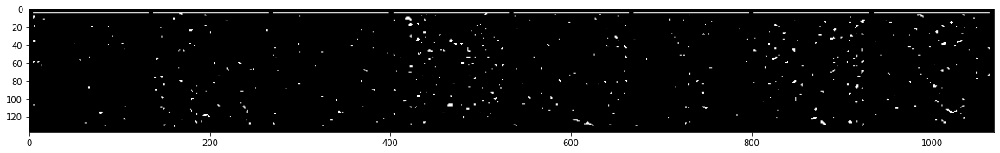

39


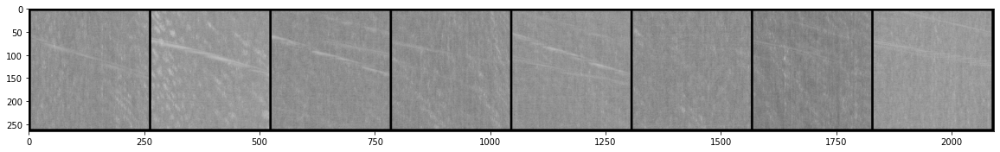

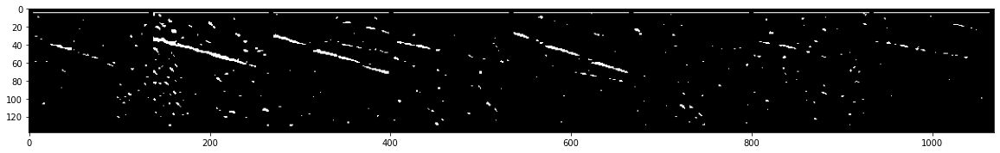

40


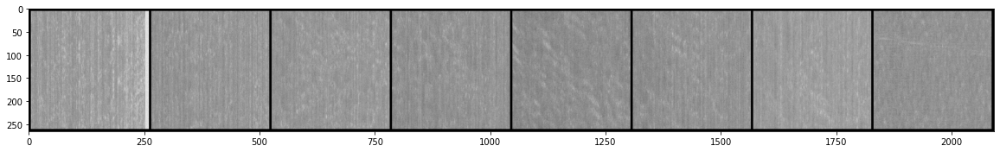

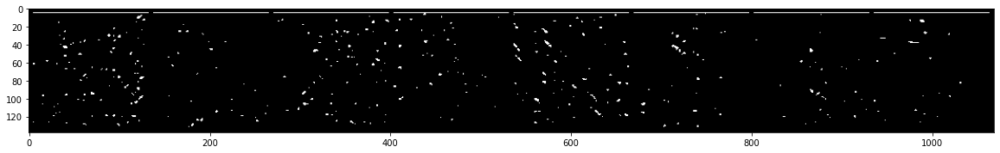

41


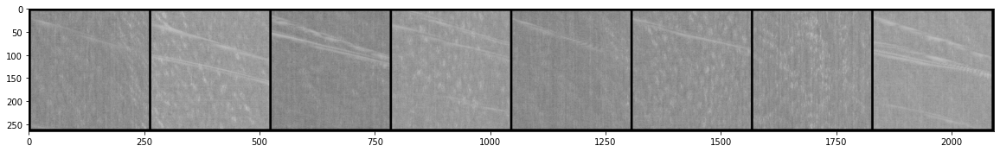

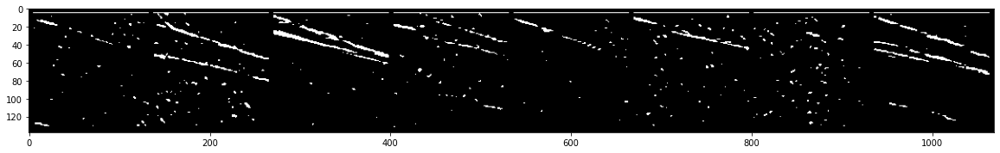

42


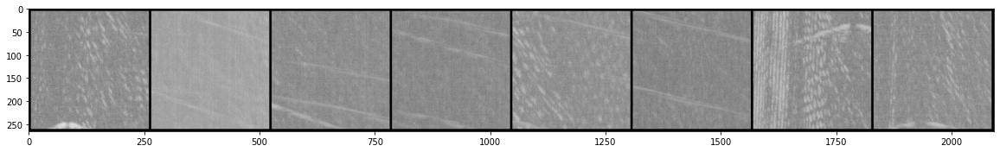

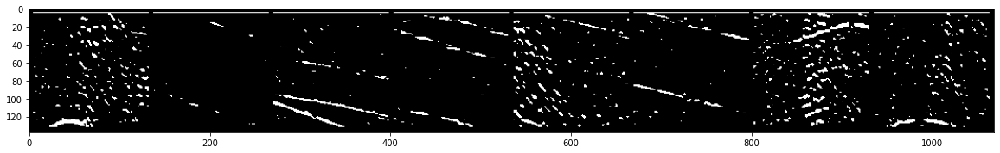

43


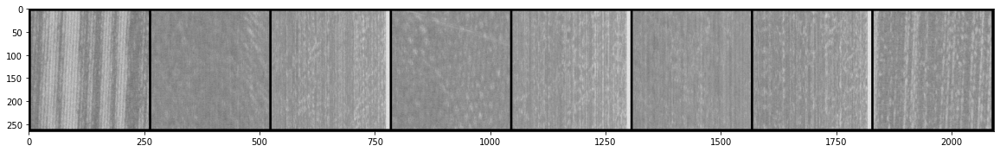

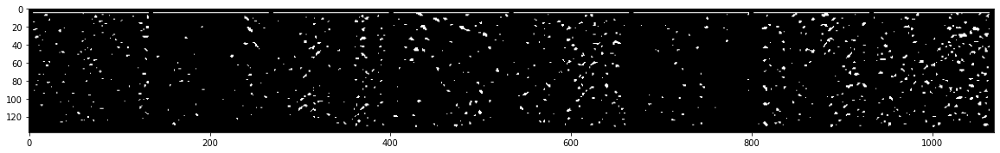

44


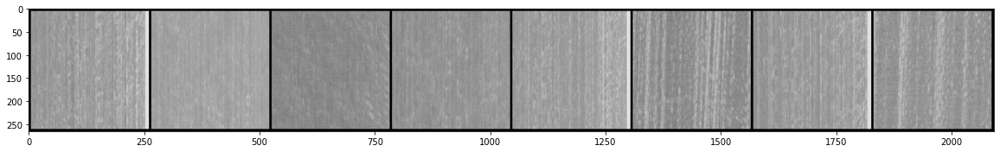

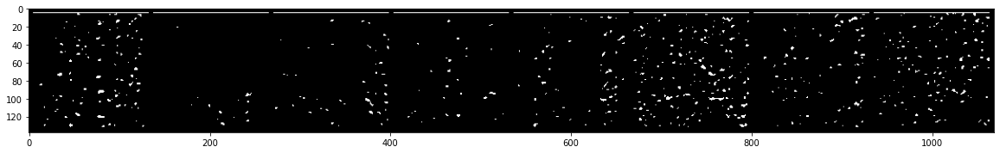

45


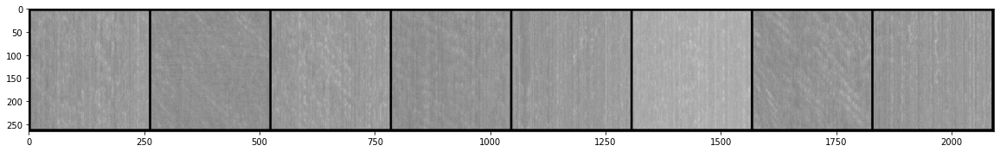

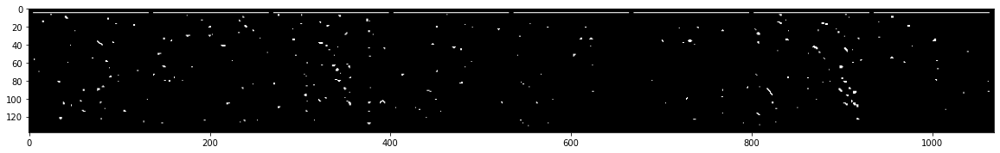

46


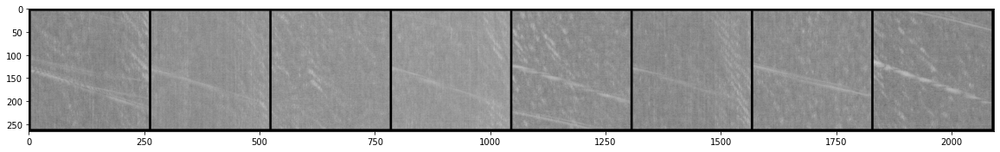

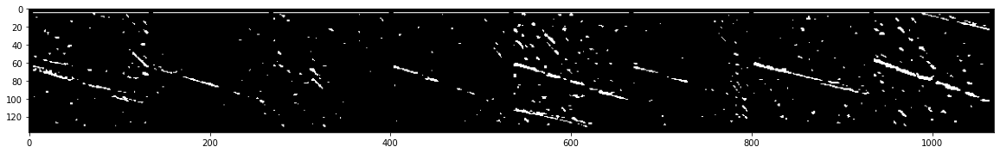

47


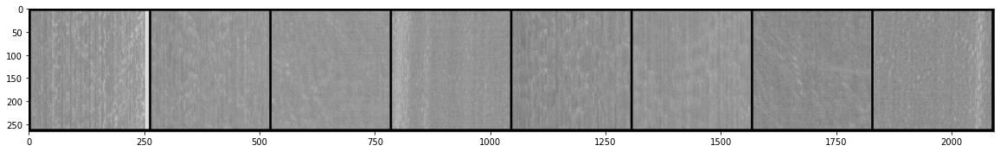

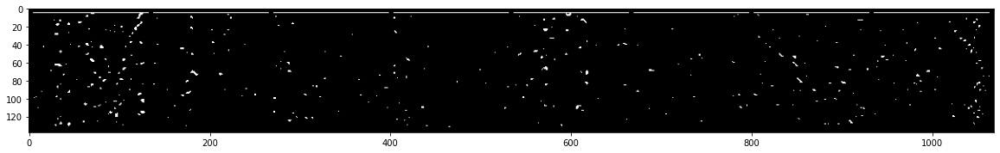

48


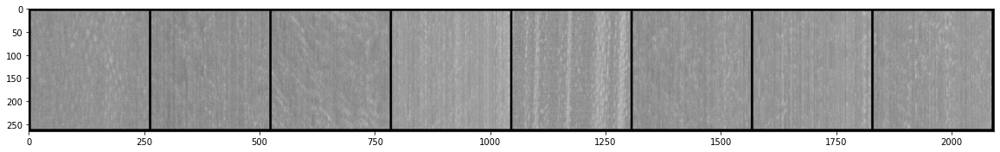

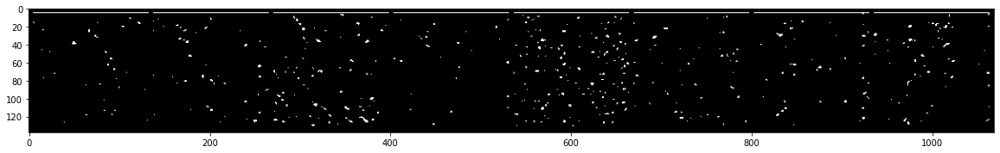

49


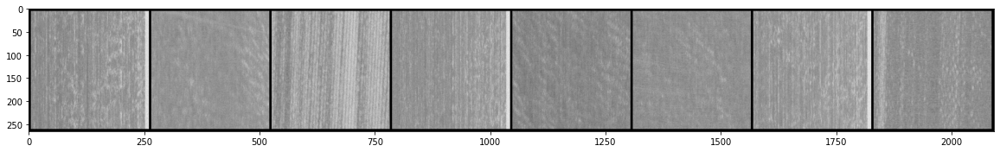

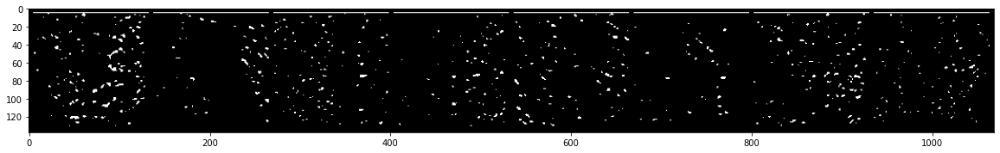

50


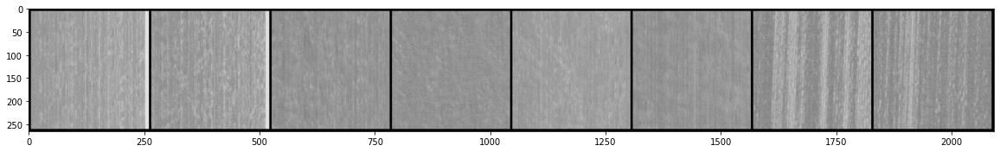

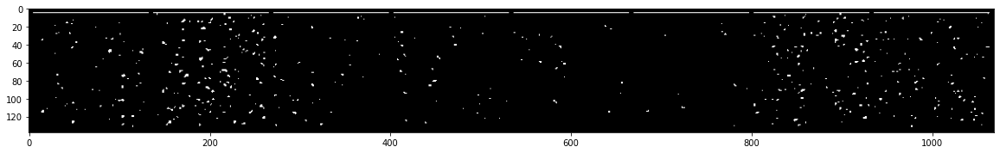

51


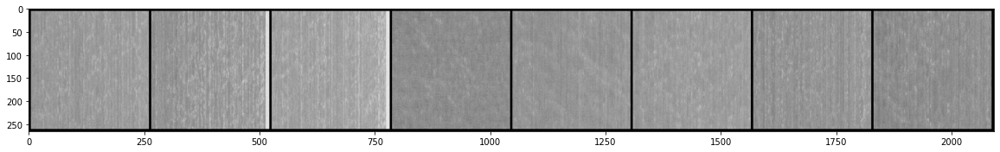

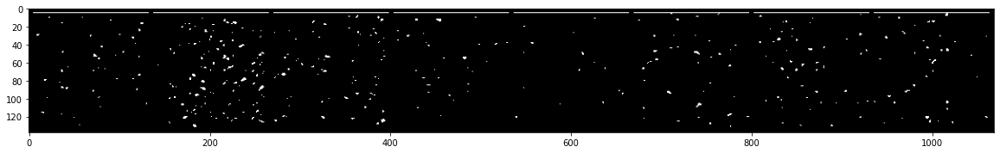

52


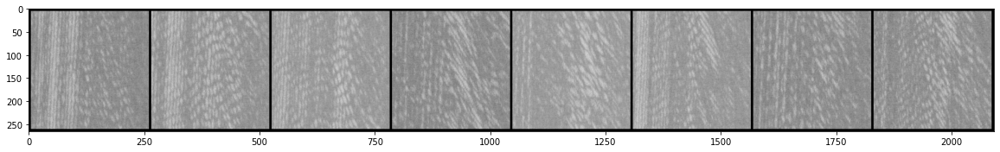

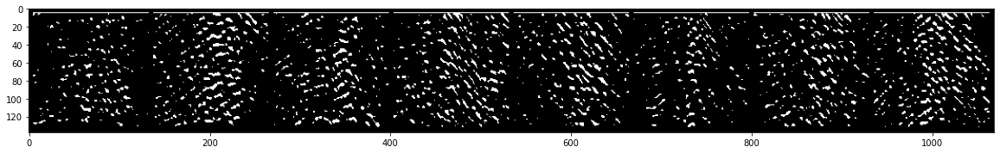

53


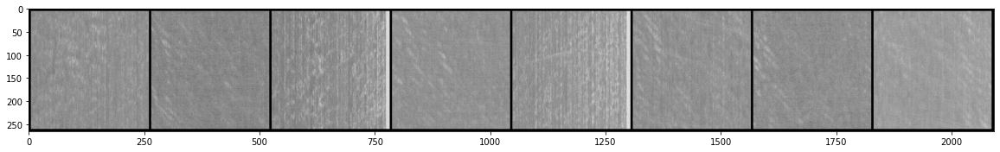

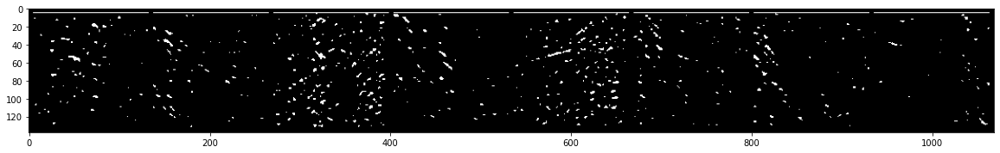

54


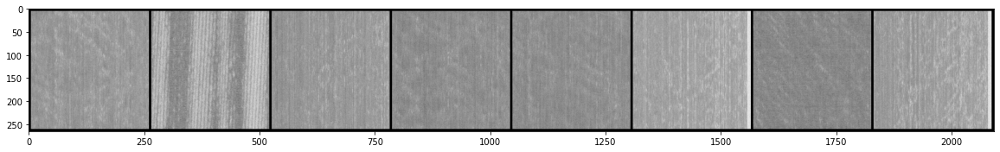

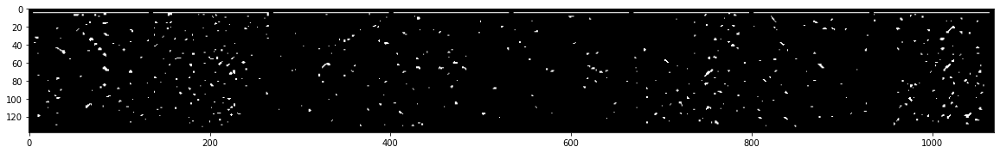

55


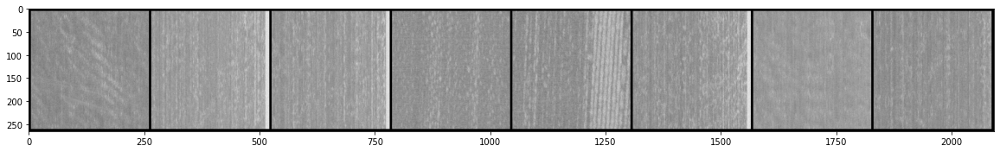

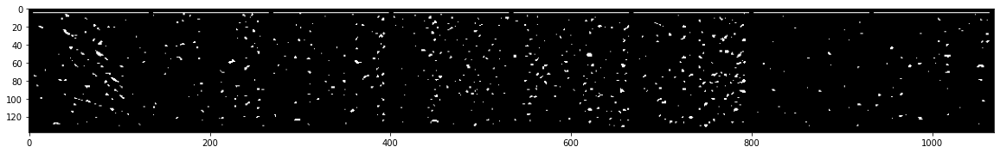

56


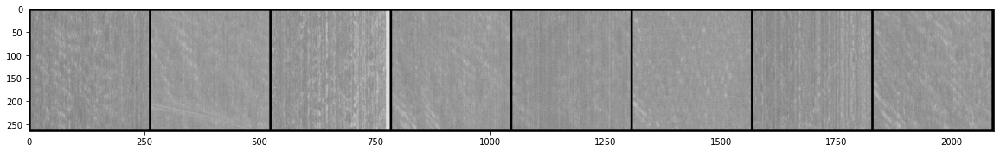

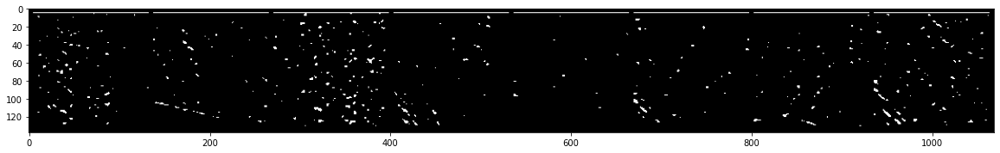

57


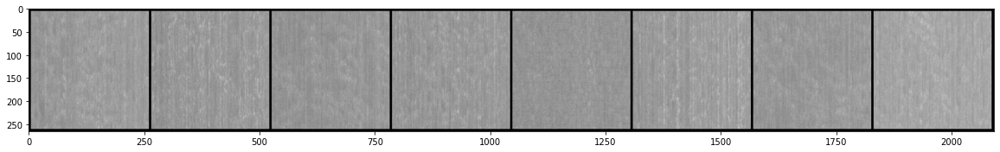

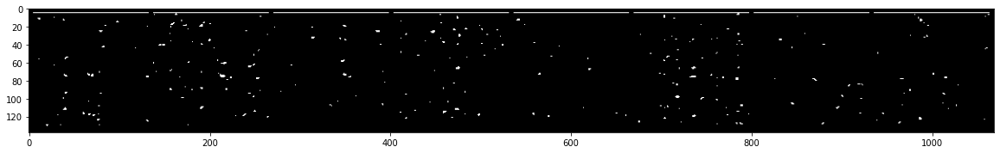

58


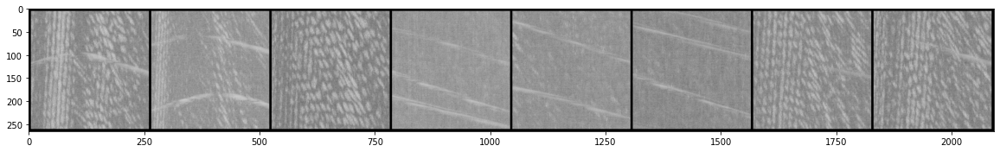

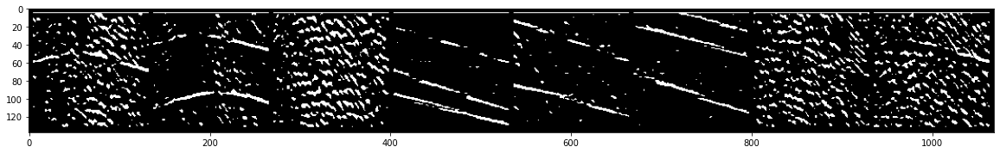

59


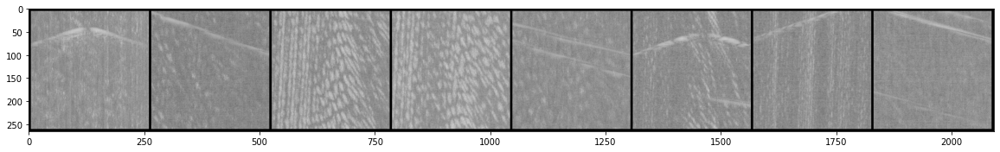

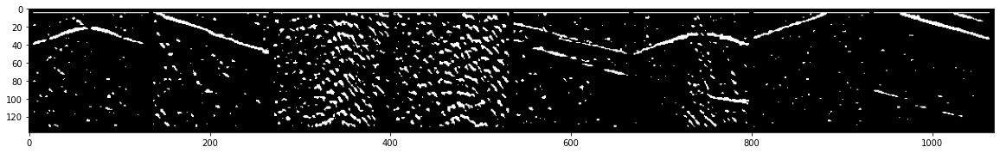

60


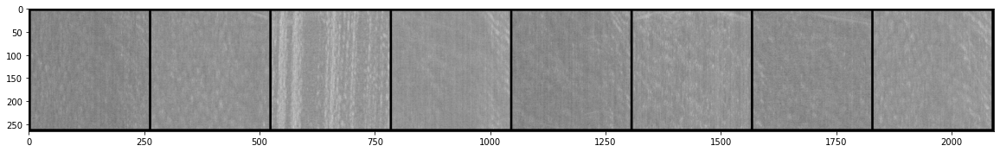

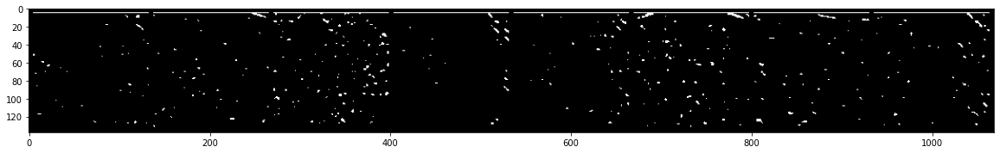

61


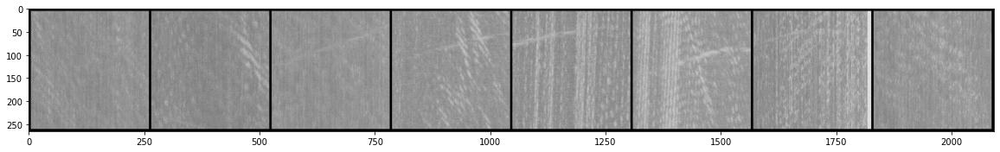

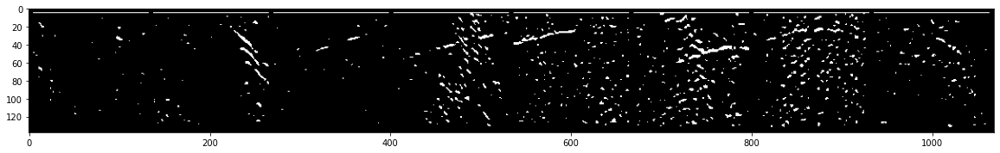

62


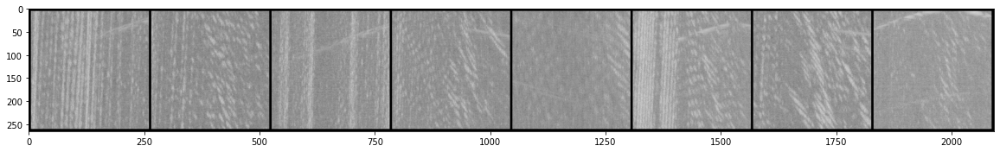

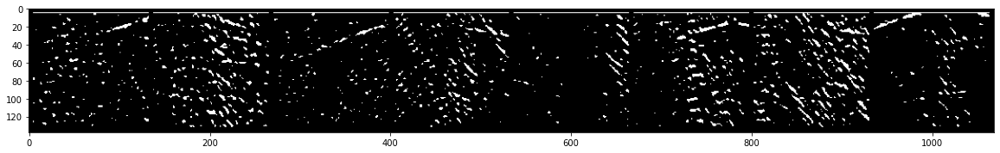

63


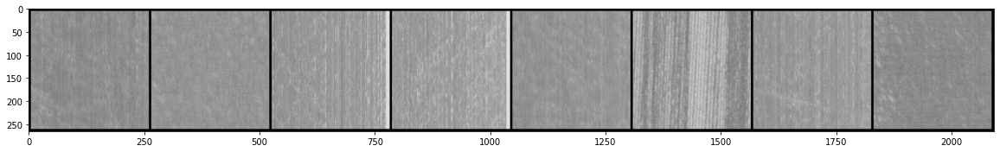

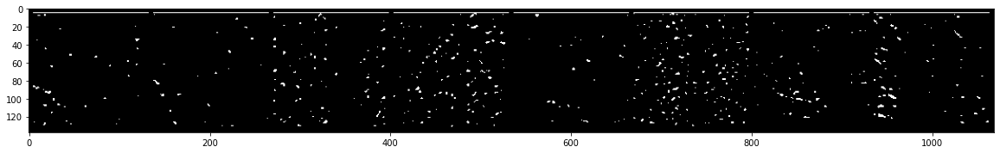

64


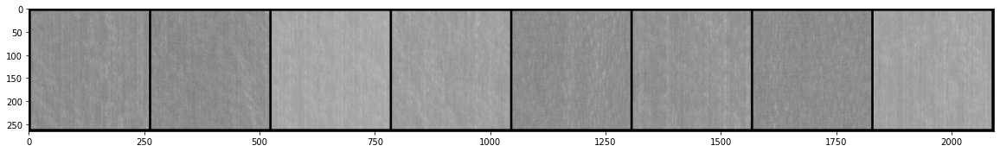

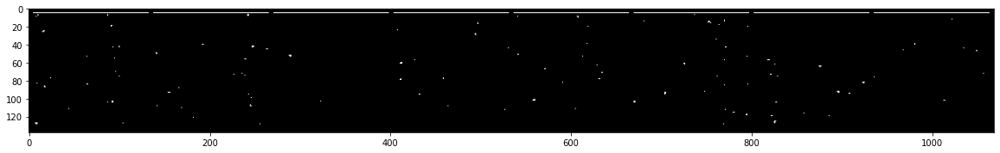

65


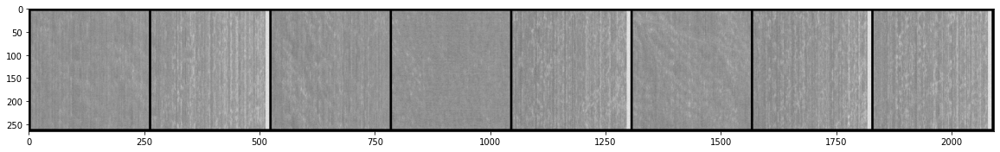

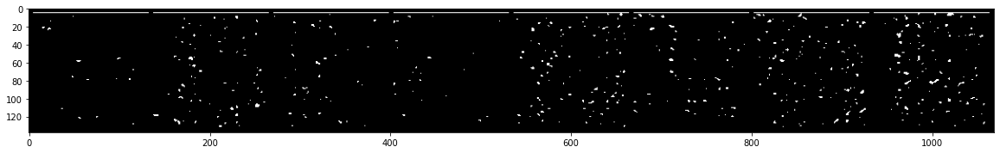

66


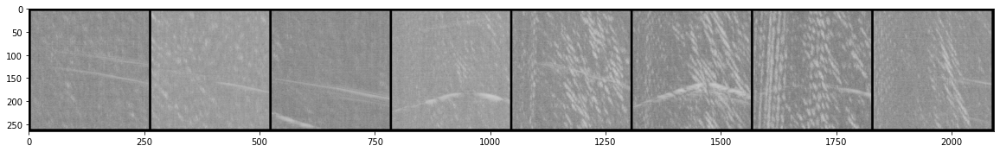

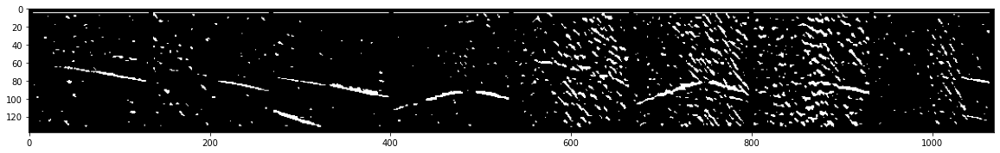

67


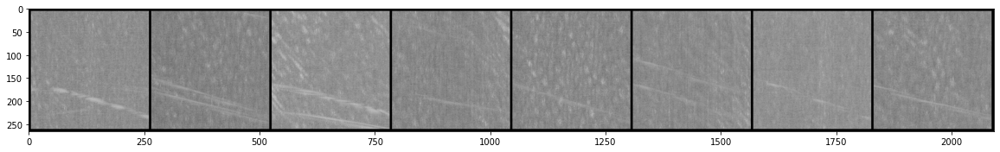

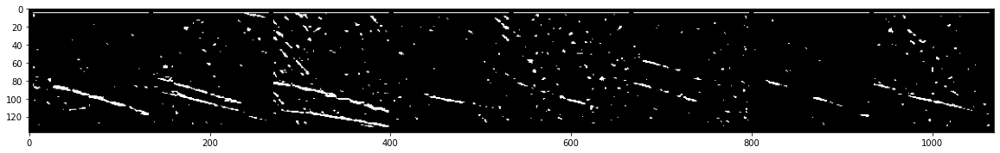

68


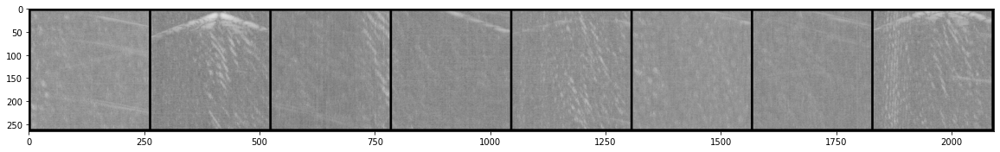

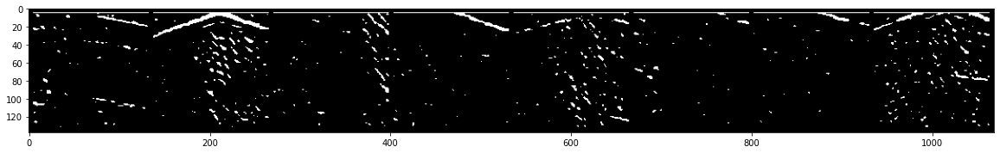

69


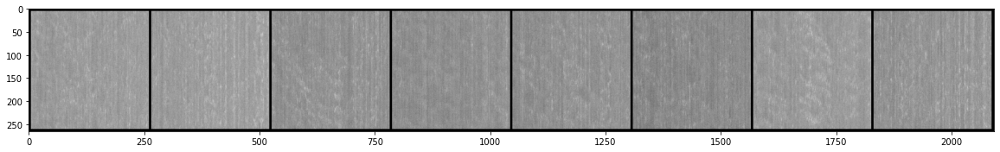

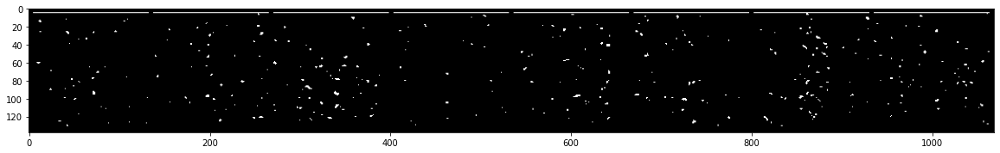

70


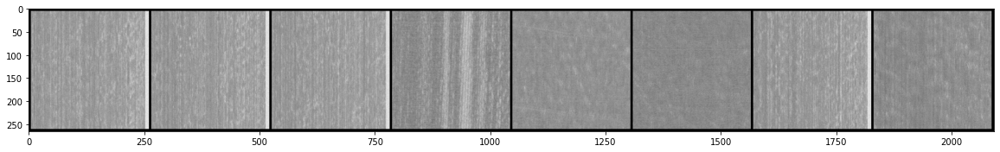

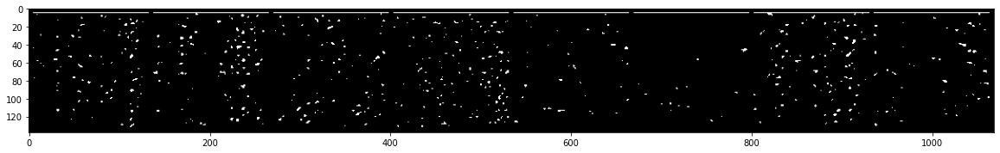

71


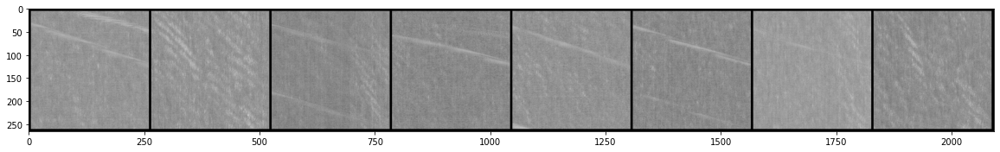

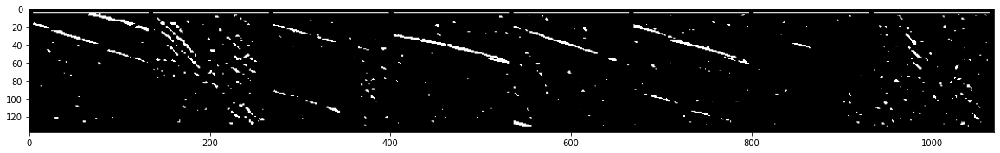

72


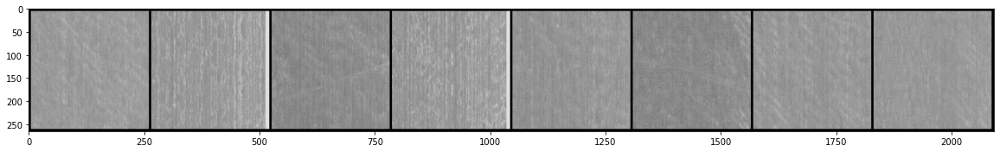

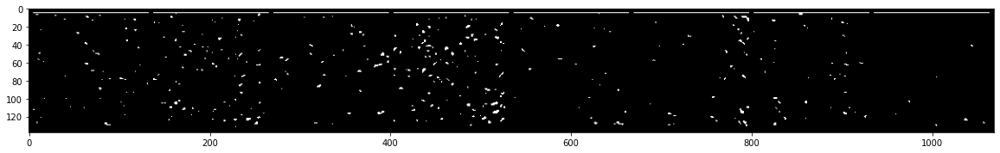

73


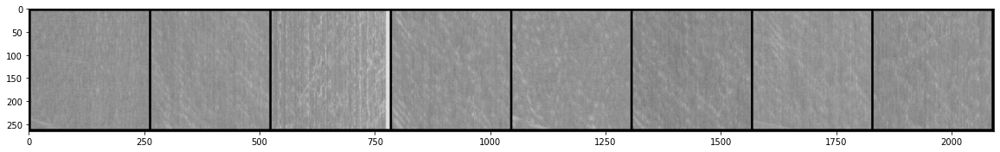

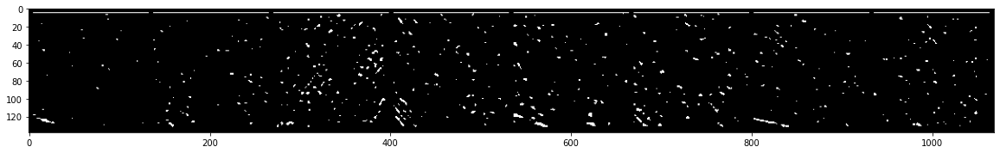

74


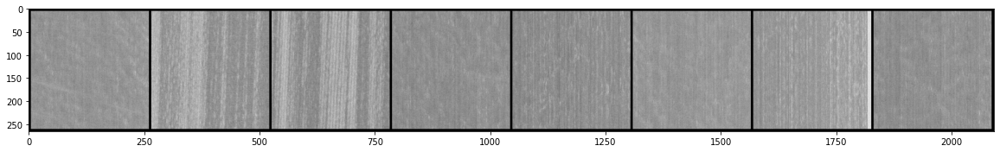

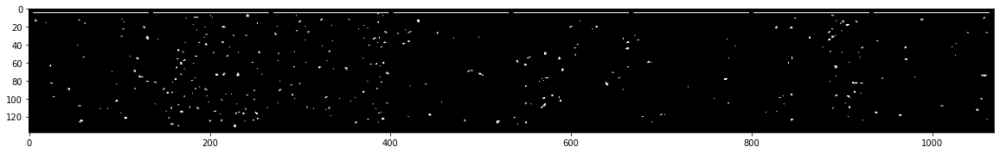

75


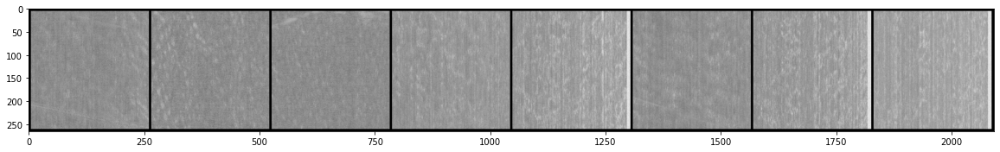

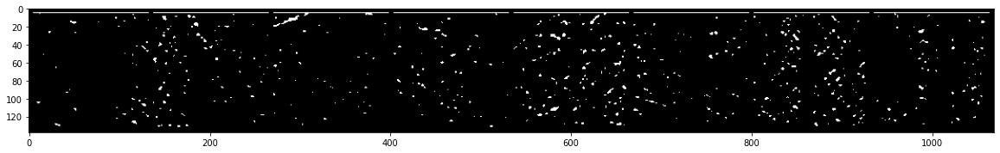

76


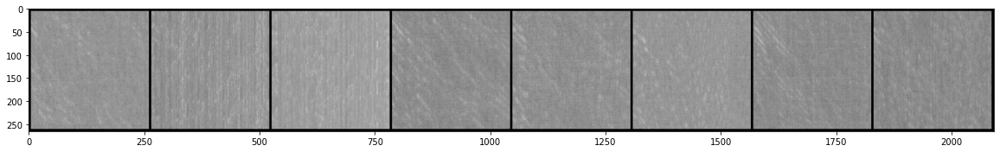

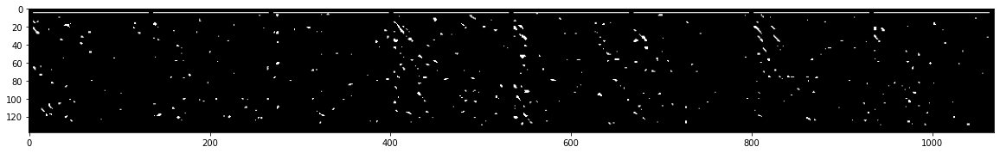

77


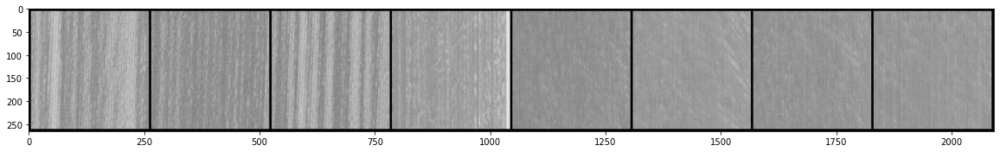

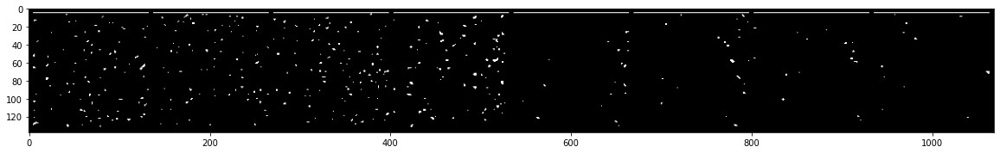

78


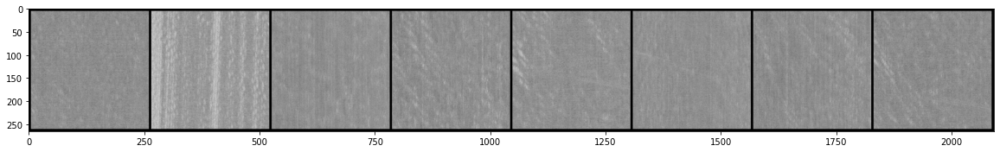

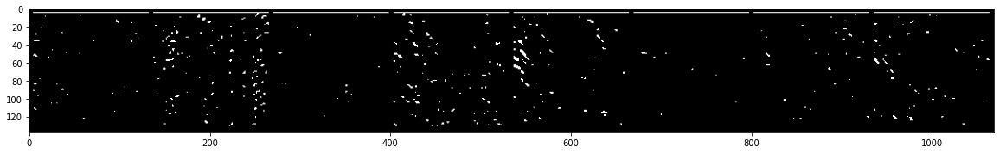

79


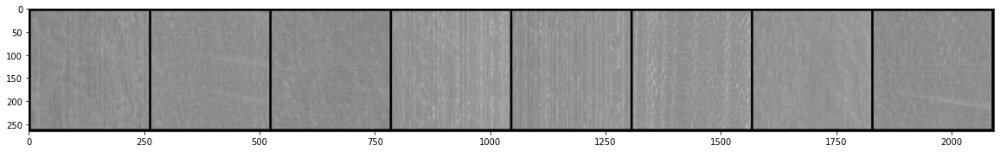

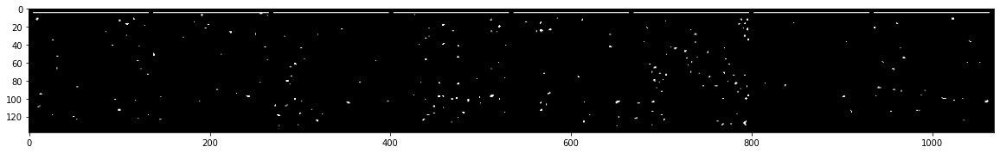

In [112]:
# 80 cluster model with best performance in terms of silhouette score
for i in range(80):
    print(i)
    visualize_samples_from_cluster(df, i, clust_id_name='80_cluster_id', n=8)

### Grouped clusters on signal confidence

We empirically determined the groupings based on looking at the random samples of the raw images within each cluster and seeing the proportion that contain fin whale vocalizations. The rough thresholds for each group are as follows:
- noise: Less than 5% of raw data contain signal
- low: 5-50% of raw data contain signal
- mid: 50-90% contain signal
- high: >90% contain signal

In [103]:
confidence_dict = dict()
confidence_dict['noise'] = [0, 1, 3, 5, 9, 12, 15, 19, 20, 21, 22, 24, 25, 27, 29,
                            30, 31, 32, 34, 36, 40, 43, 44, 45, 47, 48, 49, 50, 51,
                            52, 54, 55, 57, 60, 63, 64, 65, 69, 70, 72, 73, 74, 76, 
                            77, 78, 79]
confidence_dict['low'] = [18, 10, 7, 26, 53, 56, 75] 
confidence_dict['mid'] = [4, 6, 8, 13, 16, 17, 23, 28, 33, 35, 39, 41, 
                          42, 46, 58, 59, 61, 62, 66, 68, 71]
confidence_dict['high'] = [2, 11, 14, 39, 41, 67]

def get_confidence_level(cluster, confidence_dict):
    """
    Based on Cluster ID get the confidence level of signal
    """
    if cluster in confidence_dict['high']:
        return 3
    elif cluster in confidence_dict['mid']:
        return 2
    elif cluster in confidence_dict['low']:
        return 1
    else:
        return 0



In [113]:
df['signal_confidence'] = df.apply(lambda x: get_confidence_level(x['80_cluster_id'], confidence_dict), axis=1)

In [ ]:
visualize_samples_from_cluster(df, 

## Appendix

### Silhouette Analysis

Run this section IF you have run the generating clusters section and would like to use silhouette analysis to compare the effectivness of different clustering methods. 

Overall, silhouette analysis is a means of assessing the separation between clusters as well as the cohesion within each clustering. Silhouette score ranges from -1 to 1 with more positive scores indicating more favorable clusters. For a more detailed description of silhouette clustering click [here](https://en.wikipedia.org/wiki/Silhouette_(clustering)).

In [36]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


def silhouette_analysis(gmm, X, n_clusters):
     # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    
    ax1.set_xlim([-0.5, 1])

    
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    
    cluster_labels = gmm.predict(X)
    
    # calculate silhouette avg
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "The average silhouette_score is :",
        silhouette_avg,
    )
    
     # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.5, 0.3, 0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()

The average silhouette_score is : -0.0961629305730112


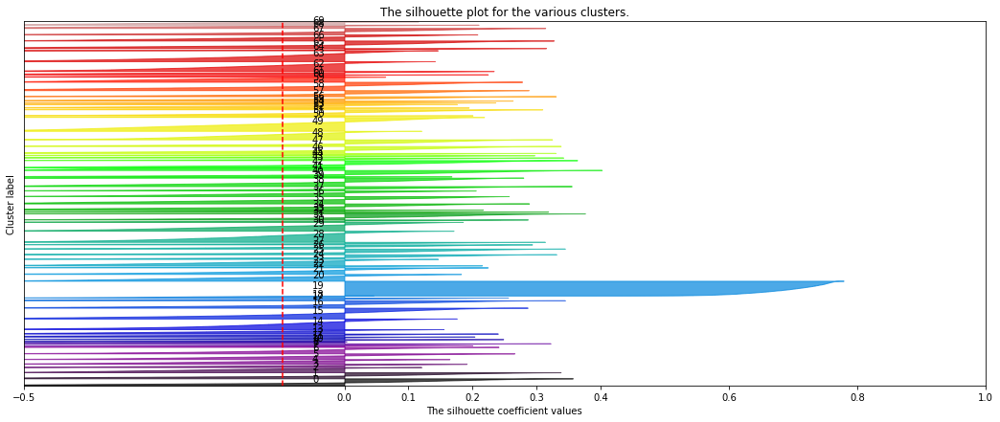

The average silhouette_score is : -0.0968059431436171


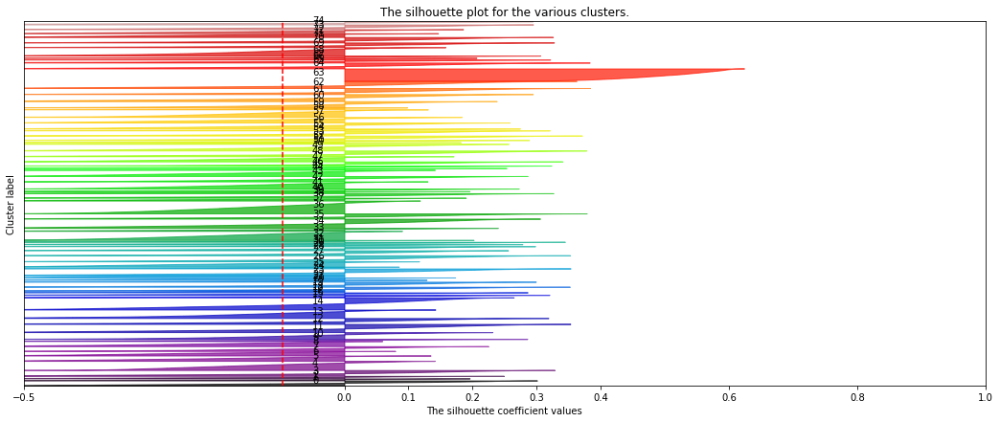

The average silhouette_score is : -0.08559348822932789


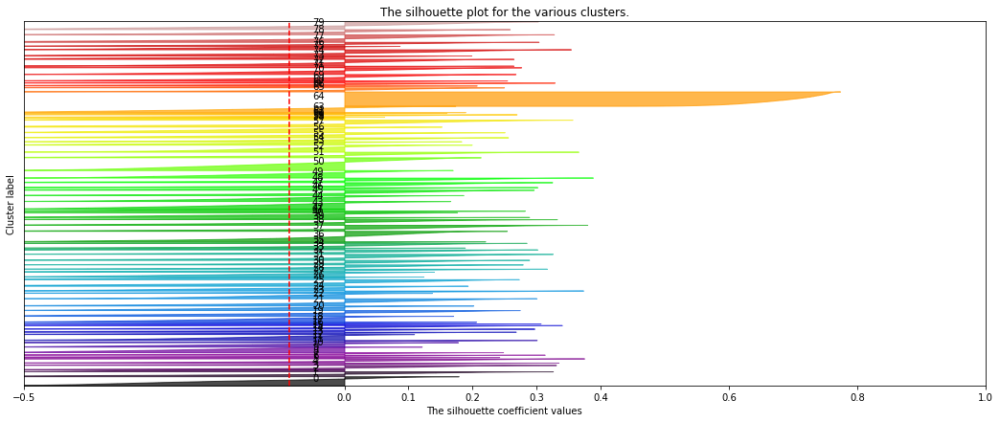

The average silhouette_score is : -0.0939060633318405


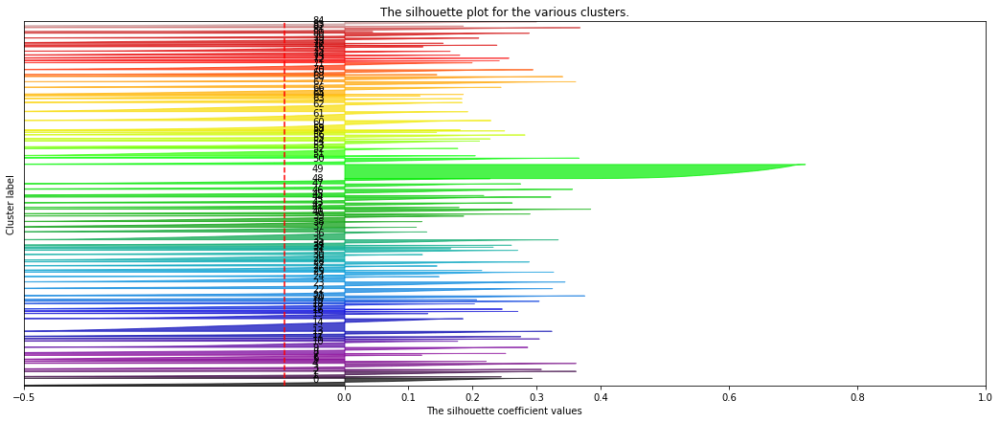

The average silhouette_score is : -0.09082263623269841


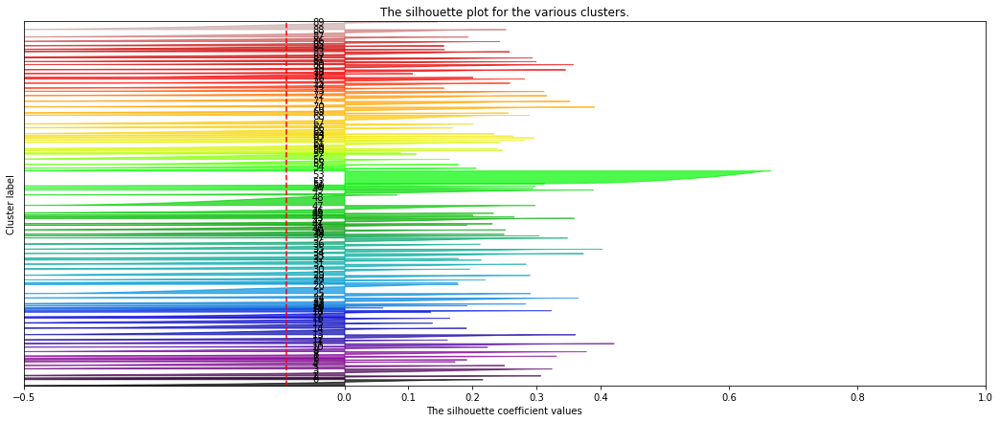

The average silhouette_score is : -0.08697040320257095


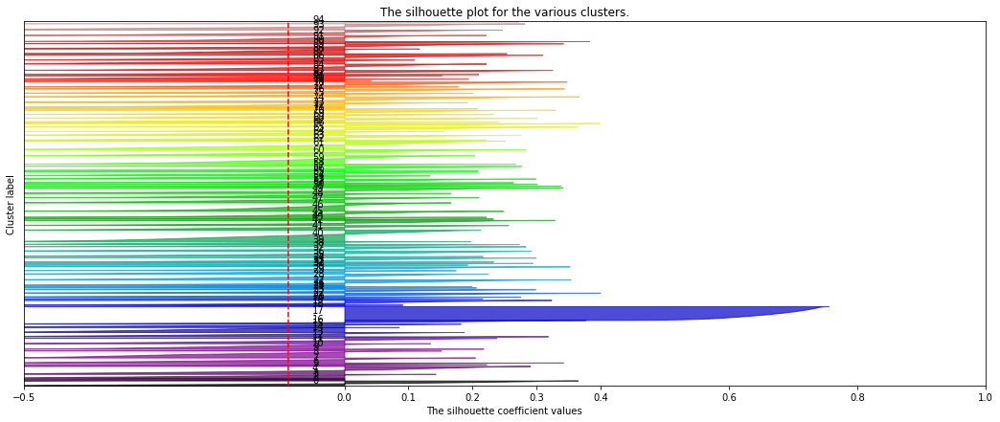

Bad pipe message: %s [b'eY\xb4O4\x03\xdd\x11\x17.\xc5\xab\n0\x8e\x13\x8a\x9d \x94\xc2\x84\xa7&\x10\x97H\xc1']
Bad pipe message: %s [b'\xc2\x8d\x85\xe1\xddS\xe2\xe4\x92),\xdd\xd6\xdb\xad\x0fm\x19{\\\xa9\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00+\x00\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 i\xb1QH\x83\xc7s\xce\x9ay\xfc\x04\x03\\\x90.p\xe7k\xd3\x93\x14\xbe.1\x1c\xe19\x88\xf4]i']
Bad pipe message: %s [b'^a\xaa\x89\xe6\x94\x97\xda3\x15\xd61\xfbm\xe8\x9d\xcf\x00\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc

In [42]:
for i in range(70, 100, 5):
    silhouette_analysis(model_list[str(i)], data_scaled, i)